# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

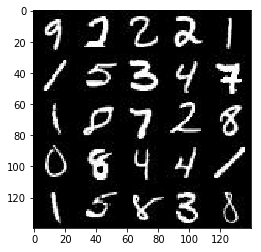

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

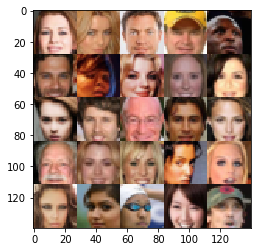

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, shape=(None, image_width, image_height, image_channels), name='real_input')
    z_input = tf.placeholder(tf.float32, shape=(None, z_dim), name='z_input')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    return real_input, z_input, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha = 0.1
    
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        relu1 = tf.maximum(alpha * x1, x1)
    
        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
       
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer_conv2d())
        x3 = tf.nn.dropout(x3, 0.8)
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        flat = tf.reshape(relu3, (-1, 4 * 4 * 512))
        logits = tf.layers.dense(flat, 1)
        discriminator_output = tf.sigmoid(logits)

    return discriminator_output, logits 


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha = 0.1
    
    with tf.variable_scope('generator', reuse=(not is_train)):
        x1 = tf.layers.dense(z, 7 * 7 * 512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        bn1 = tf.layers.batch_normalization(x1, training=is_train)
        relu1 = tf.maximum(alpha * bn1, bn1)
       
        x2 = tf.layers.conv2d_transpose(relu1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        x3 = tf.layers.conv2d_transpose(relu2, 128, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        logits = tf.layers.conv2d_transpose(relu3, out_channel_dim, 3, strides=1, padding='same')
        out = tf.tanh(logits)
  
    return out 

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    generator_model = generator(input_z, out_channel_dim)
    discriminator_model_real, discriminator_logits_real = discriminator(input_real)
    discriminator_model_fake, discriminator_logits_fake = discriminator(generator_model, reuse=True)

    discriminator_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=discriminator_logits_real, 
            labels=tf.ones_like(discriminator_model_real)
        )
    )
    discriminator_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=discriminator_logits_fake, 
            labels=tf.zeros_like(discriminator_model_fake)
        )
    )
    
    discriminator_loss = discriminator_loss_real + discriminator_loss_fake
    generator_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=discriminator_logits_fake, 
            labels=tf.ones_like(discriminator_model_fake)
        )
    )

    return discriminator_loss, generator_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    trainable_vars = tf.trainable_variables()
    discriminator_vars = [var for var in trainable_vars if var.name.startswith('discriminator')]
    generator_vars = [var for var in trainable_vars if var.name.startswith('generator')]

    descriminator_train_op = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=discriminator_vars)
    generator_train_op = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=generator_vars)
    
    return descriminator_train_op, generator_train_op

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    discriminator_loss, generator_loss = model_loss(input_real, input_z, image_channels)
    discriminator_op, generator_op = model_opt(discriminator_loss, generator_loss, lr, beta1)
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                sess.run(discriminator_op, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                sess.run(generator_op, feed_dict={input_z: batch_z, lr: learning_rate})

                if steps % 10 == 0:
                    train_loss_d = discriminator_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = generator_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 100 == 0:
                    show_generator_output(sess, 50, input_z, image_channels, data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.2453... Generator Loss: 1.7217
Epoch 1/2... Discriminator Loss: 0.1436... Generator Loss: 2.4241
Epoch 1/2... Discriminator Loss: 0.0073... Generator Loss: 5.4947
Epoch 1/2... Discriminator Loss: 0.0068... Generator Loss: 5.4995
Epoch 1/2... Discriminator Loss: 0.0048... Generator Loss: 5.5797
Epoch 1/2... Discriminator Loss: 0.0054... Generator Loss: 5.6764
Epoch 1/2... Discriminator Loss: 0.0000... Generator Loss: 18.5853
Epoch 1/2... Discriminator Loss: 0.0072... Generator Loss: 15.2191
Epoch 1/2... Discriminator Loss: 0.0034... Generator Loss: 8.4650
Epoch 1/2... Discriminator Loss: 0.0094... Generator Loss: 5.5498


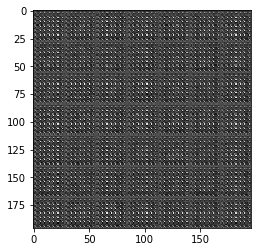

Epoch 1/2... Discriminator Loss: 0.0187... Generator Loss: 4.7664
Epoch 1/2... Discriminator Loss: 0.0022... Generator Loss: 6.4583
Epoch 1/2... Discriminator Loss: 0.0107... Generator Loss: 5.3074
Epoch 1/2... Discriminator Loss: 0.0676... Generator Loss: 3.1921
Epoch 1/2... Discriminator Loss: 4.7762... Generator Loss: 13.3366
Epoch 1/2... Discriminator Loss: 0.1641... Generator Loss: 4.8890
Epoch 1/2... Discriminator Loss: 1.7427... Generator Loss: 3.3399
Epoch 1/2... Discriminator Loss: 1.0908... Generator Loss: 1.4531
Epoch 1/2... Discriminator Loss: 1.1400... Generator Loss: 0.9595
Epoch 1/2... Discriminator Loss: 0.7895... Generator Loss: 1.1017


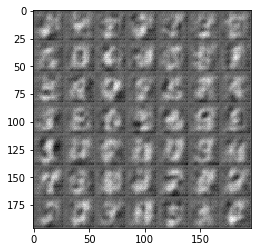

Epoch 1/2... Discriminator Loss: 1.0163... Generator Loss: 1.2465
Epoch 1/2... Discriminator Loss: 0.8017... Generator Loss: 1.1083
Epoch 1/2... Discriminator Loss: 0.7281... Generator Loss: 1.7849
Epoch 1/2... Discriminator Loss: 1.1344... Generator Loss: 0.7513
Epoch 1/2... Discriminator Loss: 0.9516... Generator Loss: 0.9973
Epoch 1/2... Discriminator Loss: 1.0598... Generator Loss: 1.2727
Epoch 1/2... Discriminator Loss: 0.7624... Generator Loss: 1.0122
Epoch 1/2... Discriminator Loss: 0.9110... Generator Loss: 1.0450
Epoch 1/2... Discriminator Loss: 0.7599... Generator Loss: 1.6385
Epoch 1/2... Discriminator Loss: 0.9092... Generator Loss: 0.9451


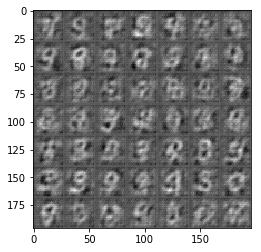

Epoch 1/2... Discriminator Loss: 0.9956... Generator Loss: 0.5598
Epoch 1/2... Discriminator Loss: 0.9449... Generator Loss: 1.6957
Epoch 1/2... Discriminator Loss: 0.8152... Generator Loss: 1.1004
Epoch 1/2... Discriminator Loss: 0.9470... Generator Loss: 0.7910
Epoch 1/2... Discriminator Loss: 0.9400... Generator Loss: 0.7178
Epoch 1/2... Discriminator Loss: 0.7807... Generator Loss: 1.0997
Epoch 1/2... Discriminator Loss: 0.7202... Generator Loss: 1.1769
Epoch 1/2... Discriminator Loss: 0.8688... Generator Loss: 0.9737
Epoch 1/2... Discriminator Loss: 0.7954... Generator Loss: 2.2346
Epoch 1/2... Discriminator Loss: 0.6835... Generator Loss: 1.2404


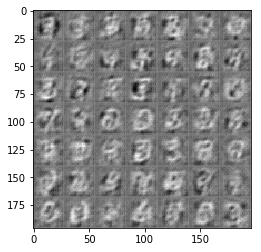

Epoch 1/2... Discriminator Loss: 0.5573... Generator Loss: 1.4077
Epoch 1/2... Discriminator Loss: 0.5430... Generator Loss: 1.7599
Epoch 1/2... Discriminator Loss: 0.6048... Generator Loss: 1.4787
Epoch 1/2... Discriminator Loss: 0.4685... Generator Loss: 1.6455
Epoch 1/2... Discriminator Loss: 0.7093... Generator Loss: 1.1290
Epoch 1/2... Discriminator Loss: 0.6166... Generator Loss: 1.4571
Epoch 1/2... Discriminator Loss: 0.6131... Generator Loss: 1.2987
Epoch 1/2... Discriminator Loss: 0.6382... Generator Loss: 1.2491
Epoch 1/2... Discriminator Loss: 0.5177... Generator Loss: 1.7431
Epoch 1/2... Discriminator Loss: 1.3101... Generator Loss: 0.3903


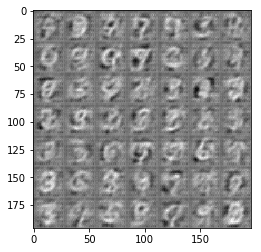

Epoch 1/2... Discriminator Loss: 0.4400... Generator Loss: 2.2606
Epoch 1/2... Discriminator Loss: 0.5248... Generator Loss: 1.4210
Epoch 1/2... Discriminator Loss: 0.6009... Generator Loss: 1.6556
Epoch 1/2... Discriminator Loss: 0.8434... Generator Loss: 0.8793
Epoch 1/2... Discriminator Loss: 0.5132... Generator Loss: 1.6059
Epoch 1/2... Discriminator Loss: 0.8865... Generator Loss: 0.9440
Epoch 1/2... Discriminator Loss: 0.4891... Generator Loss: 1.8595
Epoch 1/2... Discriminator Loss: 0.7220... Generator Loss: 1.4972
Epoch 1/2... Discriminator Loss: 0.7235... Generator Loss: 1.2009
Epoch 1/2... Discriminator Loss: 0.6741... Generator Loss: 1.1633


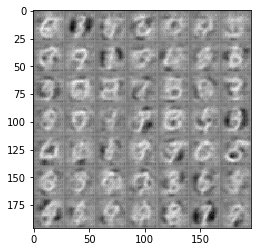

Epoch 1/2... Discriminator Loss: 0.9129... Generator Loss: 0.8753
Epoch 1/2... Discriminator Loss: 1.1291... Generator Loss: 3.0263
Epoch 1/2... Discriminator Loss: 0.8109... Generator Loss: 1.3279
Epoch 1/2... Discriminator Loss: 1.0983... Generator Loss: 0.5614
Epoch 1/2... Discriminator Loss: 1.5266... Generator Loss: 0.3372
Epoch 1/2... Discriminator Loss: 0.8753... Generator Loss: 0.8566
Epoch 1/2... Discriminator Loss: 0.8194... Generator Loss: 1.6865
Epoch 1/2... Discriminator Loss: 1.0449... Generator Loss: 0.6564
Epoch 1/2... Discriminator Loss: 0.7347... Generator Loss: 0.9994
Epoch 1/2... Discriminator Loss: 0.9375... Generator Loss: 0.9829


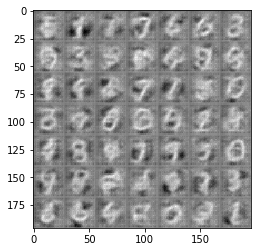

Epoch 1/2... Discriminator Loss: 1.3177... Generator Loss: 0.4865
Epoch 1/2... Discriminator Loss: 1.1529... Generator Loss: 0.6700
Epoch 1/2... Discriminator Loss: 0.8541... Generator Loss: 0.8737
Epoch 1/2... Discriminator Loss: 0.8264... Generator Loss: 0.9644
Epoch 1/2... Discriminator Loss: 1.0265... Generator Loss: 0.9763
Epoch 1/2... Discriminator Loss: 1.3473... Generator Loss: 0.4622
Epoch 1/2... Discriminator Loss: 0.8127... Generator Loss: 1.6292
Epoch 1/2... Discriminator Loss: 0.8740... Generator Loss: 1.2379
Epoch 1/2... Discriminator Loss: 0.9343... Generator Loss: 0.8932
Epoch 1/2... Discriminator Loss: 0.6969... Generator Loss: 1.4662


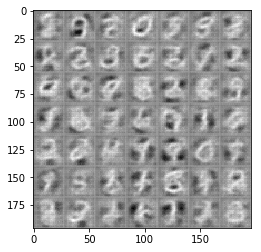

Epoch 1/2... Discriminator Loss: 0.9385... Generator Loss: 0.7730
Epoch 1/2... Discriminator Loss: 0.7095... Generator Loss: 1.1534
Epoch 1/2... Discriminator Loss: 0.8105... Generator Loss: 1.3498
Epoch 1/2... Discriminator Loss: 0.9530... Generator Loss: 0.8140
Epoch 1/2... Discriminator Loss: 0.9503... Generator Loss: 0.9153
Epoch 1/2... Discriminator Loss: 0.7609... Generator Loss: 0.9216
Epoch 1/2... Discriminator Loss: 0.9199... Generator Loss: 0.8494
Epoch 1/2... Discriminator Loss: 0.6921... Generator Loss: 1.1501
Epoch 1/2... Discriminator Loss: 1.1823... Generator Loss: 0.6820
Epoch 1/2... Discriminator Loss: 0.7218... Generator Loss: 1.6010


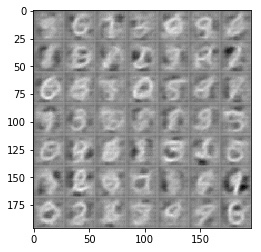

Epoch 1/2... Discriminator Loss: 1.0386... Generator Loss: 2.0456
Epoch 1/2... Discriminator Loss: 0.9159... Generator Loss: 0.7270
Epoch 1/2... Discriminator Loss: 1.3169... Generator Loss: 0.4820
Epoch 1/2... Discriminator Loss: 0.9050... Generator Loss: 0.9378
Epoch 1/2... Discriminator Loss: 0.7327... Generator Loss: 1.0140
Epoch 1/2... Discriminator Loss: 0.6525... Generator Loss: 1.2860
Epoch 1/2... Discriminator Loss: 0.8775... Generator Loss: 0.8305
Epoch 1/2... Discriminator Loss: 0.9234... Generator Loss: 0.8435
Epoch 1/2... Discriminator Loss: 0.9859... Generator Loss: 0.6810
Epoch 1/2... Discriminator Loss: 0.6457... Generator Loss: 1.4690


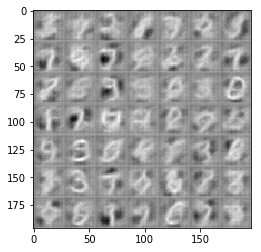

Epoch 1/2... Discriminator Loss: 0.6702... Generator Loss: 1.1434
Epoch 1/2... Discriminator Loss: 1.5435... Generator Loss: 0.3961
Epoch 1/2... Discriminator Loss: 1.1673... Generator Loss: 0.6218
Epoch 1/2... Discriminator Loss: 0.7604... Generator Loss: 1.0251
Epoch 1/2... Discriminator Loss: 0.6103... Generator Loss: 1.5940
Epoch 1/2... Discriminator Loss: 0.9245... Generator Loss: 1.1270
Epoch 1/2... Discriminator Loss: 0.8485... Generator Loss: 0.7542
Epoch 1/2... Discriminator Loss: 0.7407... Generator Loss: 1.3918
Epoch 1/2... Discriminator Loss: 0.9622... Generator Loss: 1.0989
Epoch 1/2... Discriminator Loss: 1.0018... Generator Loss: 2.2802


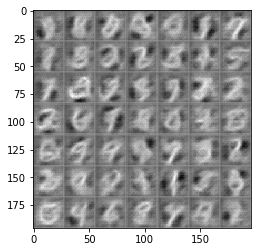

Epoch 1/2... Discriminator Loss: 0.7644... Generator Loss: 1.0846
Epoch 1/2... Discriminator Loss: 1.2865... Generator Loss: 0.5232
Epoch 1/2... Discriminator Loss: 1.4265... Generator Loss: 0.4813
Epoch 1/2... Discriminator Loss: 0.5747... Generator Loss: 1.3927
Epoch 1/2... Discriminator Loss: 1.4702... Generator Loss: 0.4731
Epoch 1/2... Discriminator Loss: 0.7028... Generator Loss: 1.1649
Epoch 1/2... Discriminator Loss: 0.9143... Generator Loss: 0.7743
Epoch 1/2... Discriminator Loss: 0.7365... Generator Loss: 0.9968
Epoch 1/2... Discriminator Loss: 0.7315... Generator Loss: 1.1529
Epoch 1/2... Discriminator Loss: 0.5692... Generator Loss: 1.8997


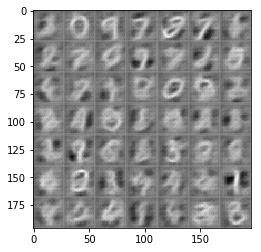

Epoch 1/2... Discriminator Loss: 0.8296... Generator Loss: 0.8865
Epoch 1/2... Discriminator Loss: 1.0384... Generator Loss: 1.1056
Epoch 1/2... Discriminator Loss: 0.7133... Generator Loss: 1.6454
Epoch 1/2... Discriminator Loss: 1.6105... Generator Loss: 0.3343
Epoch 1/2... Discriminator Loss: 0.7825... Generator Loss: 1.0288
Epoch 1/2... Discriminator Loss: 0.6927... Generator Loss: 1.4111
Epoch 1/2... Discriminator Loss: 0.5853... Generator Loss: 1.4933
Epoch 1/2... Discriminator Loss: 0.6374... Generator Loss: 1.5156
Epoch 1/2... Discriminator Loss: 0.8065... Generator Loss: 0.9059
Epoch 1/2... Discriminator Loss: 0.6897... Generator Loss: 1.0356


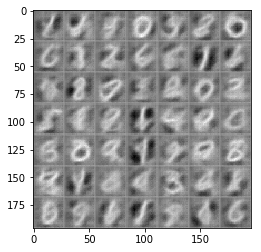

Epoch 1/2... Discriminator Loss: 0.6903... Generator Loss: 1.3169
Epoch 1/2... Discriminator Loss: 1.1480... Generator Loss: 1.9502
Epoch 1/2... Discriminator Loss: 0.5490... Generator Loss: 1.8262
Epoch 1/2... Discriminator Loss: 1.0335... Generator Loss: 0.6956
Epoch 1/2... Discriminator Loss: 0.8432... Generator Loss: 0.8938
Epoch 1/2... Discriminator Loss: 0.6724... Generator Loss: 1.3827
Epoch 1/2... Discriminator Loss: 1.2792... Generator Loss: 0.4621
Epoch 1/2... Discriminator Loss: 0.5898... Generator Loss: 1.6950
Epoch 1/2... Discriminator Loss: 0.7223... Generator Loss: 0.9999
Epoch 1/2... Discriminator Loss: 0.8006... Generator Loss: 1.0065


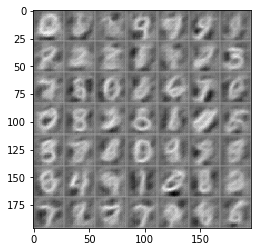

Epoch 1/2... Discriminator Loss: 0.6941... Generator Loss: 1.1893
Epoch 1/2... Discriminator Loss: 1.2263... Generator Loss: 0.5643
Epoch 1/2... Discriminator Loss: 0.5873... Generator Loss: 1.5551
Epoch 1/2... Discriminator Loss: 0.8629... Generator Loss: 0.9612
Epoch 1/2... Discriminator Loss: 0.6589... Generator Loss: 1.6287
Epoch 1/2... Discriminator Loss: 0.6612... Generator Loss: 1.1034
Epoch 1/2... Discriminator Loss: 0.6428... Generator Loss: 1.0766
Epoch 1/2... Discriminator Loss: 1.1230... Generator Loss: 0.6362
Epoch 1/2... Discriminator Loss: 0.4712... Generator Loss: 1.7986
Epoch 1/2... Discriminator Loss: 0.7525... Generator Loss: 2.2926


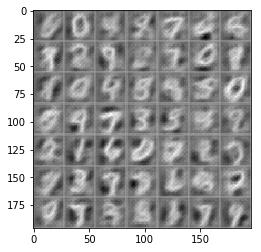

Epoch 1/2... Discriminator Loss: 0.8879... Generator Loss: 0.8840
Epoch 1/2... Discriminator Loss: 0.5296... Generator Loss: 1.2261
Epoch 1/2... Discriminator Loss: 1.5275... Generator Loss: 0.4125
Epoch 1/2... Discriminator Loss: 1.1191... Generator Loss: 0.6053
Epoch 1/2... Discriminator Loss: 0.7350... Generator Loss: 1.0230
Epoch 1/2... Discriminator Loss: 1.1386... Generator Loss: 0.5474
Epoch 1/2... Discriminator Loss: 0.6588... Generator Loss: 1.1297
Epoch 1/2... Discriminator Loss: 0.7394... Generator Loss: 1.0283
Epoch 1/2... Discriminator Loss: 0.5710... Generator Loss: 1.5420
Epoch 1/2... Discriminator Loss: 1.8083... Generator Loss: 0.4403


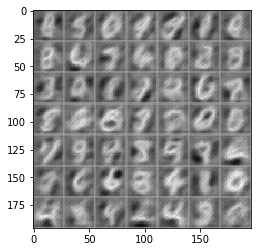

Epoch 1/2... Discriminator Loss: 0.5114... Generator Loss: 1.8560
Epoch 1/2... Discriminator Loss: 0.6778... Generator Loss: 1.4183
Epoch 1/2... Discriminator Loss: 0.7886... Generator Loss: 1.0036
Epoch 1/2... Discriminator Loss: 0.4293... Generator Loss: 2.0575
Epoch 1/2... Discriminator Loss: 0.6745... Generator Loss: 1.4084
Epoch 1/2... Discriminator Loss: 0.9832... Generator Loss: 0.6439
Epoch 1/2... Discriminator Loss: 0.8140... Generator Loss: 1.0298
Epoch 1/2... Discriminator Loss: 1.0461... Generator Loss: 0.6857
Epoch 1/2... Discriminator Loss: 0.7542... Generator Loss: 0.8402
Epoch 1/2... Discriminator Loss: 1.7734... Generator Loss: 2.7329


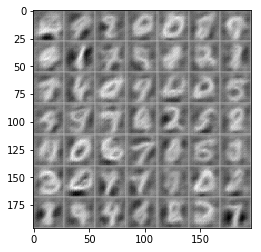

Epoch 1/2... Discriminator Loss: 0.6689... Generator Loss: 1.1584
Epoch 1/2... Discriminator Loss: 1.0302... Generator Loss: 0.8075
Epoch 1/2... Discriminator Loss: 0.7921... Generator Loss: 0.9396
Epoch 1/2... Discriminator Loss: 0.7001... Generator Loss: 1.1107
Epoch 1/2... Discriminator Loss: 0.7480... Generator Loss: 1.1157
Epoch 1/2... Discriminator Loss: 0.9768... Generator Loss: 0.8313
Epoch 1/2... Discriminator Loss: 0.4907... Generator Loss: 1.9170
Epoch 1/2... Discriminator Loss: 0.9224... Generator Loss: 0.7844
Epoch 1/2... Discriminator Loss: 0.6144... Generator Loss: 1.0991
Epoch 1/2... Discriminator Loss: 0.6152... Generator Loss: 1.2441


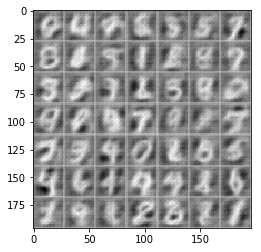

Epoch 1/2... Discriminator Loss: 1.1462... Generator Loss: 0.6996
Epoch 1/2... Discriminator Loss: 0.7590... Generator Loss: 1.5369
Epoch 1/2... Discriminator Loss: 1.1178... Generator Loss: 0.5771
Epoch 1/2... Discriminator Loss: 0.8553... Generator Loss: 0.8154
Epoch 1/2... Discriminator Loss: 0.9054... Generator Loss: 0.7423
Epoch 1/2... Discriminator Loss: 0.7118... Generator Loss: 1.0169
Epoch 1/2... Discriminator Loss: 0.8858... Generator Loss: 0.8869
Epoch 2/2... Discriminator Loss: 0.8296... Generator Loss: 0.9723
Epoch 2/2... Discriminator Loss: 1.4186... Generator Loss: 3.1728
Epoch 2/2... Discriminator Loss: 1.0332... Generator Loss: 0.7345


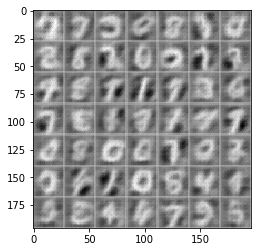

Epoch 2/2... Discriminator Loss: 1.0798... Generator Loss: 0.6726
Epoch 2/2... Discriminator Loss: 0.6421... Generator Loss: 1.0480
Epoch 2/2... Discriminator Loss: 1.5400... Generator Loss: 0.3839
Epoch 2/2... Discriminator Loss: 0.6652... Generator Loss: 1.3529
Epoch 2/2... Discriminator Loss: 0.8102... Generator Loss: 0.9471
Epoch 2/2... Discriminator Loss: 1.3987... Generator Loss: 0.4778
Epoch 2/2... Discriminator Loss: 0.8577... Generator Loss: 0.8811
Epoch 2/2... Discriminator Loss: 1.7160... Generator Loss: 0.3468
Epoch 2/2... Discriminator Loss: 1.6707... Generator Loss: 0.3664
Epoch 2/2... Discriminator Loss: 2.4511... Generator Loss: 0.1516


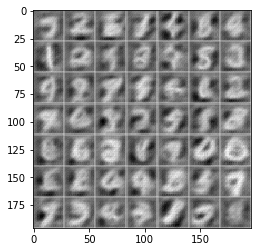

Epoch 2/2... Discriminator Loss: 0.6147... Generator Loss: 1.5232
Epoch 2/2... Discriminator Loss: 0.7149... Generator Loss: 1.0243
Epoch 2/2... Discriminator Loss: 1.2761... Generator Loss: 0.5778
Epoch 2/2... Discriminator Loss: 0.8105... Generator Loss: 0.9473
Epoch 2/2... Discriminator Loss: 0.7659... Generator Loss: 1.1074
Epoch 2/2... Discriminator Loss: 1.2610... Generator Loss: 0.5516
Epoch 2/2... Discriminator Loss: 0.6000... Generator Loss: 2.1840
Epoch 2/2... Discriminator Loss: 0.6524... Generator Loss: 1.1446
Epoch 2/2... Discriminator Loss: 1.2343... Generator Loss: 0.6249
Epoch 2/2... Discriminator Loss: 0.5777... Generator Loss: 1.3044


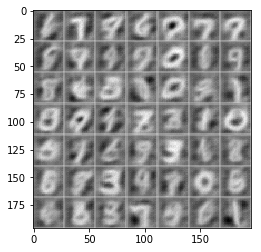

Epoch 2/2... Discriminator Loss: 0.6265... Generator Loss: 1.3144
Epoch 2/2... Discriminator Loss: 1.3463... Generator Loss: 0.5006
Epoch 2/2... Discriminator Loss: 0.6182... Generator Loss: 1.2090
Epoch 2/2... Discriminator Loss: 1.3092... Generator Loss: 0.4713
Epoch 2/2... Discriminator Loss: 1.0256... Generator Loss: 2.2045
Epoch 2/2... Discriminator Loss: 0.4313... Generator Loss: 1.8697
Epoch 2/2... Discriminator Loss: 0.7617... Generator Loss: 0.8374
Epoch 2/2... Discriminator Loss: 0.8170... Generator Loss: 0.8461
Epoch 2/2... Discriminator Loss: 0.6781... Generator Loss: 1.0596
Epoch 2/2... Discriminator Loss: 0.5522... Generator Loss: 1.4354


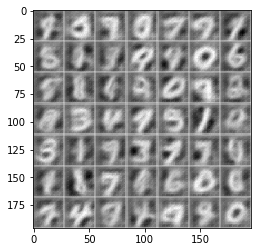

Epoch 2/2... Discriminator Loss: 0.5571... Generator Loss: 1.5188
Epoch 2/2... Discriminator Loss: 0.9891... Generator Loss: 0.8030
Epoch 2/2... Discriminator Loss: 0.5536... Generator Loss: 1.3757
Epoch 2/2... Discriminator Loss: 0.6429... Generator Loss: 1.5735
Epoch 2/2... Discriminator Loss: 0.6660... Generator Loss: 1.2722
Epoch 2/2... Discriminator Loss: 0.7386... Generator Loss: 0.9978
Epoch 2/2... Discriminator Loss: 0.8209... Generator Loss: 0.9994
Epoch 2/2... Discriminator Loss: 0.6446... Generator Loss: 1.8022
Epoch 2/2... Discriminator Loss: 0.9125... Generator Loss: 0.8101
Epoch 2/2... Discriminator Loss: 0.5028... Generator Loss: 1.7713


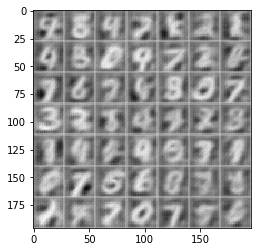

Epoch 2/2... Discriminator Loss: 1.0022... Generator Loss: 0.8534
Epoch 2/2... Discriminator Loss: 0.6571... Generator Loss: 1.4447
Epoch 2/2... Discriminator Loss: 1.2946... Generator Loss: 0.4813
Epoch 2/2... Discriminator Loss: 0.8989... Generator Loss: 0.8084
Epoch 2/2... Discriminator Loss: 2.0911... Generator Loss: 0.1993
Epoch 2/2... Discriminator Loss: 1.2317... Generator Loss: 0.6680
Epoch 2/2... Discriminator Loss: 0.4626... Generator Loss: 1.6049
Epoch 2/2... Discriminator Loss: 0.7950... Generator Loss: 0.9548
Epoch 2/2... Discriminator Loss: 1.6245... Generator Loss: 0.3115
Epoch 2/2... Discriminator Loss: 0.7924... Generator Loss: 1.9530


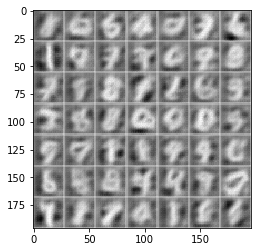

Epoch 2/2... Discriminator Loss: 0.9465... Generator Loss: 0.7478
Epoch 2/2... Discriminator Loss: 0.6385... Generator Loss: 1.5604
Epoch 2/2... Discriminator Loss: 0.7794... Generator Loss: 2.1684
Epoch 2/2... Discriminator Loss: 1.4822... Generator Loss: 0.4653
Epoch 2/2... Discriminator Loss: 0.3936... Generator Loss: 2.2532
Epoch 2/2... Discriminator Loss: 0.8020... Generator Loss: 1.0151
Epoch 2/2... Discriminator Loss: 0.5282... Generator Loss: 1.4692
Epoch 2/2... Discriminator Loss: 0.5455... Generator Loss: 2.0559
Epoch 2/2... Discriminator Loss: 0.5121... Generator Loss: 2.2153
Epoch 2/2... Discriminator Loss: 1.9221... Generator Loss: 0.2721


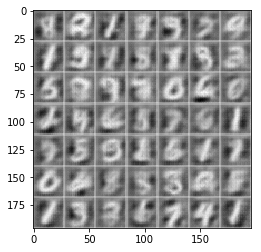

Epoch 2/2... Discriminator Loss: 0.9859... Generator Loss: 0.8621
Epoch 2/2... Discriminator Loss: 0.7221... Generator Loss: 0.9507
Epoch 2/2... Discriminator Loss: 0.7205... Generator Loss: 1.4948
Epoch 2/2... Discriminator Loss: 1.0861... Generator Loss: 0.6262
Epoch 2/2... Discriminator Loss: 0.7127... Generator Loss: 1.0002
Epoch 2/2... Discriminator Loss: 0.6040... Generator Loss: 1.3841
Epoch 2/2... Discriminator Loss: 0.8993... Generator Loss: 0.8073
Epoch 2/2... Discriminator Loss: 1.2592... Generator Loss: 0.5265
Epoch 2/2... Discriminator Loss: 0.6256... Generator Loss: 1.2448
Epoch 2/2... Discriminator Loss: 0.4527... Generator Loss: 1.6654


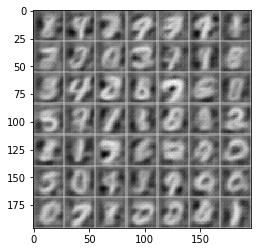

Epoch 2/2... Discriminator Loss: 0.4009... Generator Loss: 1.5909
Epoch 2/2... Discriminator Loss: 0.7101... Generator Loss: 2.1927
Epoch 2/2... Discriminator Loss: 0.5472... Generator Loss: 2.1641
Epoch 2/2... Discriminator Loss: 0.4274... Generator Loss: 1.8850
Epoch 2/2... Discriminator Loss: 1.3979... Generator Loss: 0.5679
Epoch 2/2... Discriminator Loss: 0.6990... Generator Loss: 1.2790
Epoch 2/2... Discriminator Loss: 0.8289... Generator Loss: 0.7857
Epoch 2/2... Discriminator Loss: 0.7245... Generator Loss: 1.0543
Epoch 2/2... Discriminator Loss: 0.8876... Generator Loss: 0.9688
Epoch 2/2... Discriminator Loss: 0.6491... Generator Loss: 1.1320


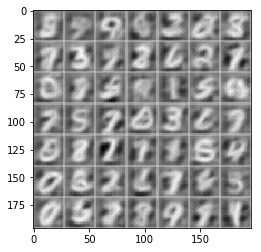

Epoch 2/2... Discriminator Loss: 0.5820... Generator Loss: 2.0926
Epoch 2/2... Discriminator Loss: 0.4198... Generator Loss: 2.3585
Epoch 2/2... Discriminator Loss: 1.0098... Generator Loss: 0.7559
Epoch 2/2... Discriminator Loss: 1.7127... Generator Loss: 0.4229
Epoch 2/2... Discriminator Loss: 1.0565... Generator Loss: 0.7041
Epoch 2/2... Discriminator Loss: 0.6767... Generator Loss: 1.3128
Epoch 2/2... Discriminator Loss: 1.7871... Generator Loss: 0.3867
Epoch 2/2... Discriminator Loss: 0.9491... Generator Loss: 0.7965
Epoch 2/2... Discriminator Loss: 0.3392... Generator Loss: 1.9771
Epoch 2/2... Discriminator Loss: 0.5281... Generator Loss: 1.5243


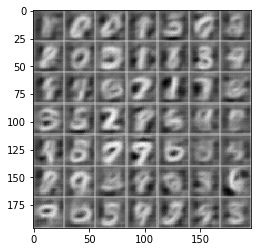

Epoch 2/2... Discriminator Loss: 0.5959... Generator Loss: 1.1956
Epoch 2/2... Discriminator Loss: 1.2250... Generator Loss: 0.6006
Epoch 2/2... Discriminator Loss: 0.8504... Generator Loss: 0.8390
Epoch 2/2... Discriminator Loss: 0.8709... Generator Loss: 0.8759
Epoch 2/2... Discriminator Loss: 1.0114... Generator Loss: 0.7395
Epoch 2/2... Discriminator Loss: 0.7673... Generator Loss: 1.4654
Epoch 2/2... Discriminator Loss: 0.6306... Generator Loss: 1.1557
Epoch 2/2... Discriminator Loss: 0.7444... Generator Loss: 1.0249
Epoch 2/2... Discriminator Loss: 1.1378... Generator Loss: 0.6255
Epoch 2/2... Discriminator Loss: 1.0472... Generator Loss: 0.7533


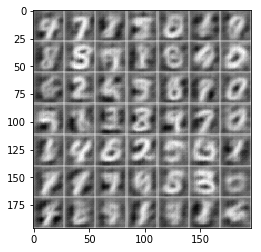

Epoch 2/2... Discriminator Loss: 0.4945... Generator Loss: 2.0337
Epoch 2/2... Discriminator Loss: 0.5175... Generator Loss: 1.8367
Epoch 2/2... Discriminator Loss: 0.7411... Generator Loss: 1.4138
Epoch 2/2... Discriminator Loss: 1.0594... Generator Loss: 0.7331
Epoch 2/2... Discriminator Loss: 0.5723... Generator Loss: 1.9418
Epoch 2/2... Discriminator Loss: 0.7417... Generator Loss: 1.0847
Epoch 2/2... Discriminator Loss: 0.7502... Generator Loss: 1.2167
Epoch 2/2... Discriminator Loss: 0.5297... Generator Loss: 1.3250
Epoch 2/2... Discriminator Loss: 0.6841... Generator Loss: 0.9189
Epoch 2/2... Discriminator Loss: 1.0744... Generator Loss: 0.7137


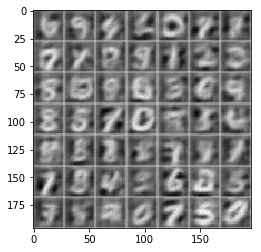

Epoch 2/2... Discriminator Loss: 0.5326... Generator Loss: 1.6339
Epoch 2/2... Discriminator Loss: 0.3632... Generator Loss: 1.8420
Epoch 2/2... Discriminator Loss: 1.3164... Generator Loss: 0.5646
Epoch 2/2... Discriminator Loss: 1.8272... Generator Loss: 0.3711
Epoch 2/2... Discriminator Loss: 0.3227... Generator Loss: 3.2414
Epoch 2/2... Discriminator Loss: 0.5797... Generator Loss: 1.4540
Epoch 2/2... Discriminator Loss: 0.8832... Generator Loss: 0.8095
Epoch 2/2... Discriminator Loss: 0.4504... Generator Loss: 1.5684
Epoch 2/2... Discriminator Loss: 0.6428... Generator Loss: 1.6307
Epoch 2/2... Discriminator Loss: 0.6185... Generator Loss: 1.0952


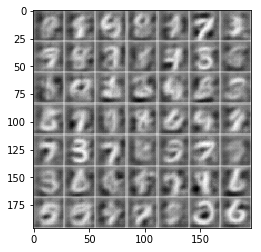

Epoch 2/2... Discriminator Loss: 0.6357... Generator Loss: 1.2855
Epoch 2/2... Discriminator Loss: 0.3134... Generator Loss: 2.0122
Epoch 2/2... Discriminator Loss: 1.1981... Generator Loss: 0.5057
Epoch 2/2... Discriminator Loss: 1.0748... Generator Loss: 0.8145
Epoch 2/2... Discriminator Loss: 1.4912... Generator Loss: 0.4096
Epoch 2/2... Discriminator Loss: 0.5658... Generator Loss: 1.4242
Epoch 2/2... Discriminator Loss: 0.5332... Generator Loss: 1.5860
Epoch 2/2... Discriminator Loss: 0.6657... Generator Loss: 0.9404
Epoch 2/2... Discriminator Loss: 0.7050... Generator Loss: 1.2777
Epoch 2/2... Discriminator Loss: 0.2792... Generator Loss: 2.3594


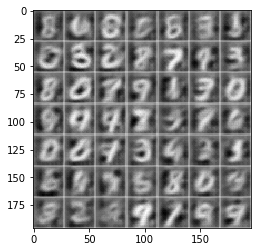

Epoch 2/2... Discriminator Loss: 0.5533... Generator Loss: 1.5173
Epoch 2/2... Discriminator Loss: 4.5489... Generator Loss: 0.0389
Epoch 2/2... Discriminator Loss: 0.8045... Generator Loss: 1.1357
Epoch 2/2... Discriminator Loss: 0.5899... Generator Loss: 1.4877
Epoch 2/2... Discriminator Loss: 0.6987... Generator Loss: 1.2315
Epoch 2/2... Discriminator Loss: 0.5738... Generator Loss: 1.1780
Epoch 2/2... Discriminator Loss: 0.4527... Generator Loss: 1.8635
Epoch 2/2... Discriminator Loss: 0.4300... Generator Loss: 1.8398
Epoch 2/2... Discriminator Loss: 0.4966... Generator Loss: 1.4786
Epoch 2/2... Discriminator Loss: 0.7451... Generator Loss: 1.9345


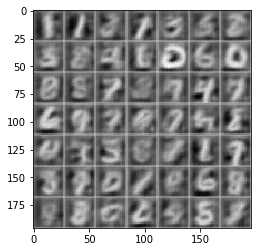

Epoch 2/2... Discriminator Loss: 0.9679... Generator Loss: 0.8798
Epoch 2/2... Discriminator Loss: 0.5454... Generator Loss: 1.5402
Epoch 2/2... Discriminator Loss: 0.4757... Generator Loss: 1.7571
Epoch 2/2... Discriminator Loss: 0.5518... Generator Loss: 1.2910
Epoch 2/2... Discriminator Loss: 1.1334... Generator Loss: 0.5331
Epoch 2/2... Discriminator Loss: 0.5181... Generator Loss: 1.9420
Epoch 2/2... Discriminator Loss: 0.7812... Generator Loss: 1.0282
Epoch 2/2... Discriminator Loss: 1.0377... Generator Loss: 0.7566
Epoch 2/2... Discriminator Loss: 0.6924... Generator Loss: 1.5416
Epoch 2/2... Discriminator Loss: 0.6052... Generator Loss: 1.3575


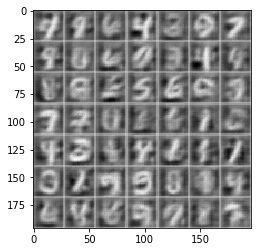

Epoch 2/2... Discriminator Loss: 0.4272... Generator Loss: 1.9255
Epoch 2/2... Discriminator Loss: 1.2754... Generator Loss: 0.5790
Epoch 2/2... Discriminator Loss: 0.5001... Generator Loss: 1.5448
Epoch 2/2... Discriminator Loss: 0.7764... Generator Loss: 1.1279
Epoch 2/2... Discriminator Loss: 0.3846... Generator Loss: 2.2524
Epoch 2/2... Discriminator Loss: 1.0070... Generator Loss: 0.7537
Epoch 2/2... Discriminator Loss: 0.4745... Generator Loss: 1.9693
Epoch 2/2... Discriminator Loss: 1.9069... Generator Loss: 0.2846
Epoch 2/2... Discriminator Loss: 0.7068... Generator Loss: 1.1560
Epoch 2/2... Discriminator Loss: 0.9969... Generator Loss: 0.8839


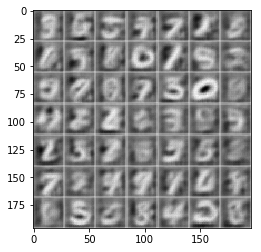

Epoch 2/2... Discriminator Loss: 0.7538... Generator Loss: 1.4737
Epoch 2/2... Discriminator Loss: 0.8114... Generator Loss: 0.9198
Epoch 2/2... Discriminator Loss: 0.3890... Generator Loss: 2.2799
Epoch 2/2... Discriminator Loss: 0.6734... Generator Loss: 1.0619
Epoch 2/2... Discriminator Loss: 0.5516... Generator Loss: 1.2367
Epoch 2/2... Discriminator Loss: 0.5936... Generator Loss: 1.5378
Epoch 2/2... Discriminator Loss: 0.4948... Generator Loss: 1.5635
Epoch 2/2... Discriminator Loss: 0.3877... Generator Loss: 1.7715
Epoch 2/2... Discriminator Loss: 0.7850... Generator Loss: 0.9404
Epoch 2/2... Discriminator Loss: 0.4799... Generator Loss: 1.2351


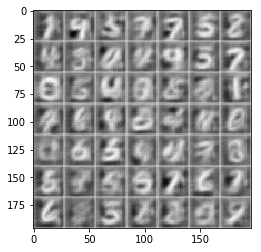

Epoch 2/2... Discriminator Loss: 0.6432... Generator Loss: 2.4914
Epoch 2/2... Discriminator Loss: 0.3992... Generator Loss: 1.6535
Epoch 2/2... Discriminator Loss: 0.6174... Generator Loss: 1.1701
Epoch 2/2... Discriminator Loss: 0.7733... Generator Loss: 1.2658
Epoch 2/2... Discriminator Loss: 0.6322... Generator Loss: 1.2364
Epoch 2/2... Discriminator Loss: 0.4244... Generator Loss: 1.6209
Epoch 2/2... Discriminator Loss: 1.6719... Generator Loss: 0.2962
Epoch 2/2... Discriminator Loss: 0.2907... Generator Loss: 2.2458
Epoch 2/2... Discriminator Loss: 0.5686... Generator Loss: 1.3382
Epoch 2/2... Discriminator Loss: 0.4205... Generator Loss: 2.6271


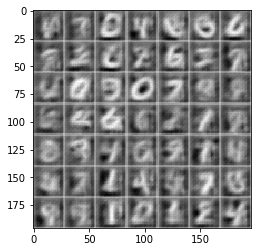

Epoch 2/2... Discriminator Loss: 0.6443... Generator Loss: 1.5788
Epoch 2/2... Discriminator Loss: 0.6857... Generator Loss: 1.3716
Epoch 2/2... Discriminator Loss: 0.5930... Generator Loss: 1.3489
Epoch 2/2... Discriminator Loss: 0.7230... Generator Loss: 0.9763
Epoch 2/2... Discriminator Loss: 0.4621... Generator Loss: 1.7326


In [12]:
batch_size = 32
z_dim = 100
learning_rate = 1e-4
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.7746... Generator Loss: 1.1590
Epoch 1/1... Discriminator Loss: 0.4253... Generator Loss: 1.7518
Epoch 1/1... Discriminator Loss: 0.3410... Generator Loss: 1.8593
Epoch 1/1... Discriminator Loss: 0.2424... Generator Loss: 2.1606
Epoch 1/1... Discriminator Loss: 0.2089... Generator Loss: 2.1743
Epoch 1/1... Discriminator Loss: 0.2047... Generator Loss: 2.5139
Epoch 1/1... Discriminator Loss: 0.1785... Generator Loss: 2.3528
Epoch 1/1... Discriminator Loss: 0.1294... Generator Loss: 2.6388
Epoch 1/1... Discriminator Loss: 0.1657... Generator Loss: 2.7237
Epoch 1/1... Discriminator Loss: 0.0838... Generator Loss: 2.9353


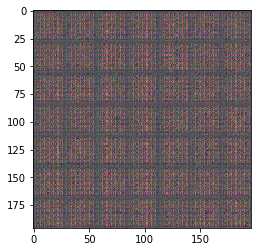

Epoch 1/1... Discriminator Loss: 0.1471... Generator Loss: 2.7657
Epoch 1/1... Discriminator Loss: 0.1104... Generator Loss: 2.8542
Epoch 1/1... Discriminator Loss: 0.0851... Generator Loss: 3.1756
Epoch 1/1... Discriminator Loss: 0.0940... Generator Loss: 3.3111
Epoch 1/1... Discriminator Loss: 0.0719... Generator Loss: 3.3547
Epoch 1/1... Discriminator Loss: 0.1061... Generator Loss: 2.6793
Epoch 1/1... Discriminator Loss: 0.1335... Generator Loss: 3.4106
Epoch 1/1... Discriminator Loss: 0.0564... Generator Loss: 3.3459
Epoch 1/1... Discriminator Loss: 0.0761... Generator Loss: 3.3275
Epoch 1/1... Discriminator Loss: 0.0718... Generator Loss: 3.3626


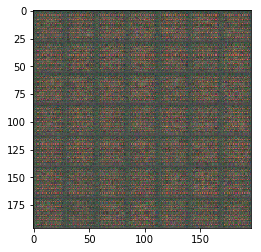

Epoch 1/1... Discriminator Loss: 0.0841... Generator Loss: 3.2349
Epoch 1/1... Discriminator Loss: 0.1163... Generator Loss: 3.2644
Epoch 1/1... Discriminator Loss: 0.1634... Generator Loss: 3.1524
Epoch 1/1... Discriminator Loss: 0.0647... Generator Loss: 3.3981
Epoch 1/1... Discriminator Loss: 0.0780... Generator Loss: 3.2370
Epoch 1/1... Discriminator Loss: 0.0840... Generator Loss: 3.3261
Epoch 1/1... Discriminator Loss: 0.0907... Generator Loss: 3.4926
Epoch 1/1... Discriminator Loss: 0.1422... Generator Loss: 2.9220
Epoch 1/1... Discriminator Loss: 0.0986... Generator Loss: 3.6277
Epoch 1/1... Discriminator Loss: 0.0387... Generator Loss: 3.7106


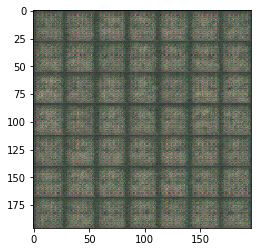

Epoch 1/1... Discriminator Loss: 0.0467... Generator Loss: 3.5523
Epoch 1/1... Discriminator Loss: 0.1120... Generator Loss: 3.3238
Epoch 1/1... Discriminator Loss: 0.0823... Generator Loss: 3.4566
Epoch 1/1... Discriminator Loss: 0.0550... Generator Loss: 3.7238
Epoch 1/1... Discriminator Loss: 0.0853... Generator Loss: 3.2201
Epoch 1/1... Discriminator Loss: 0.1069... Generator Loss: 3.1944
Epoch 1/1... Discriminator Loss: 0.0621... Generator Loss: 3.7174
Epoch 1/1... Discriminator Loss: 0.0622... Generator Loss: 3.6472
Epoch 1/1... Discriminator Loss: 0.1267... Generator Loss: 3.4016
Epoch 1/1... Discriminator Loss: 0.0974... Generator Loss: 3.3044


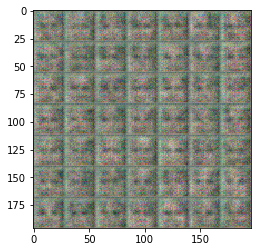

Epoch 1/1... Discriminator Loss: 0.0882... Generator Loss: 4.1022
Epoch 1/1... Discriminator Loss: 0.1087... Generator Loss: 3.3096
Epoch 1/1... Discriminator Loss: 0.1529... Generator Loss: 3.1195
Epoch 1/1... Discriminator Loss: 0.1330... Generator Loss: 3.3473
Epoch 1/1... Discriminator Loss: 0.0983... Generator Loss: 3.3979
Epoch 1/1... Discriminator Loss: 0.2593... Generator Loss: 2.3248
Epoch 1/1... Discriminator Loss: 0.2000... Generator Loss: 3.2995
Epoch 1/1... Discriminator Loss: 0.2252... Generator Loss: 2.3824
Epoch 1/1... Discriminator Loss: 0.3085... Generator Loss: 2.0855
Epoch 1/1... Discriminator Loss: 0.2361... Generator Loss: 2.1591


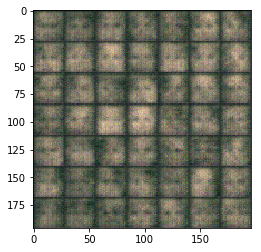

Epoch 1/1... Discriminator Loss: 0.1946... Generator Loss: 3.0326
Epoch 1/1... Discriminator Loss: 0.1285... Generator Loss: 3.1529
Epoch 1/1... Discriminator Loss: 0.1454... Generator Loss: 3.6679
Epoch 1/1... Discriminator Loss: 0.1773... Generator Loss: 2.7319
Epoch 1/1... Discriminator Loss: 0.1374... Generator Loss: 3.2233
Epoch 1/1... Discriminator Loss: 0.1600... Generator Loss: 2.9830
Epoch 1/1... Discriminator Loss: 0.1810... Generator Loss: 2.9821
Epoch 1/1... Discriminator Loss: 0.1932... Generator Loss: 2.2196
Epoch 1/1... Discriminator Loss: 0.1184... Generator Loss: 3.0683
Epoch 1/1... Discriminator Loss: 0.2287... Generator Loss: 2.8060


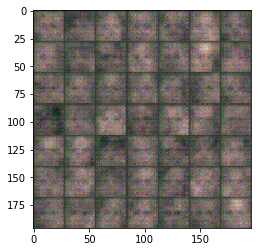

Epoch 1/1... Discriminator Loss: 0.1704... Generator Loss: 2.5313
Epoch 1/1... Discriminator Loss: 0.2179... Generator Loss: 2.5218
Epoch 1/1... Discriminator Loss: 0.1365... Generator Loss: 2.6832
Epoch 1/1... Discriminator Loss: 0.1342... Generator Loss: 3.0675
Epoch 1/1... Discriminator Loss: 0.2640... Generator Loss: 2.5654
Epoch 1/1... Discriminator Loss: 0.1966... Generator Loss: 2.8932
Epoch 1/1... Discriminator Loss: 0.1802... Generator Loss: 2.9955
Epoch 1/1... Discriminator Loss: 0.1248... Generator Loss: 3.1443
Epoch 1/1... Discriminator Loss: 0.1525... Generator Loss: 3.3447
Epoch 1/1... Discriminator Loss: 0.2004... Generator Loss: 2.3025


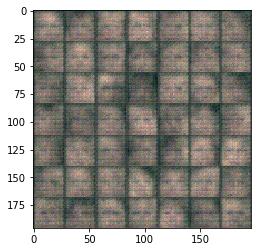

Epoch 1/1... Discriminator Loss: 0.2470... Generator Loss: 3.1329
Epoch 1/1... Discriminator Loss: 0.1783... Generator Loss: 2.6232
Epoch 1/1... Discriminator Loss: 0.1634... Generator Loss: 2.7809
Epoch 1/1... Discriminator Loss: 0.2592... Generator Loss: 2.2487
Epoch 1/1... Discriminator Loss: 0.1970... Generator Loss: 2.4938
Epoch 1/1... Discriminator Loss: 0.1770... Generator Loss: 3.0848
Epoch 1/1... Discriminator Loss: 0.1824... Generator Loss: 2.6705
Epoch 1/1... Discriminator Loss: 0.2794... Generator Loss: 2.4134
Epoch 1/1... Discriminator Loss: 0.2238... Generator Loss: 3.3208
Epoch 1/1... Discriminator Loss: 0.2512... Generator Loss: 2.2042


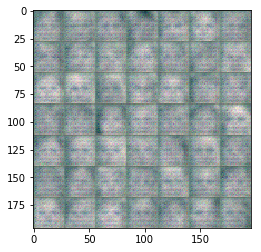

Epoch 1/1... Discriminator Loss: 0.2475... Generator Loss: 2.5166
Epoch 1/1... Discriminator Loss: 0.2930... Generator Loss: 1.9247
Epoch 1/1... Discriminator Loss: 0.2942... Generator Loss: 2.5806
Epoch 1/1... Discriminator Loss: 0.3280... Generator Loss: 2.0486
Epoch 1/1... Discriminator Loss: 0.3732... Generator Loss: 2.4492
Epoch 1/1... Discriminator Loss: 0.2239... Generator Loss: 2.8543
Epoch 1/1... Discriminator Loss: 0.4360... Generator Loss: 1.7910
Epoch 1/1... Discriminator Loss: 0.3542... Generator Loss: 2.4505
Epoch 1/1... Discriminator Loss: 0.3181... Generator Loss: 2.0443
Epoch 1/1... Discriminator Loss: 0.3519... Generator Loss: 2.3088


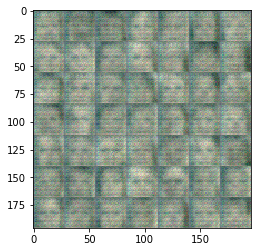

Epoch 1/1... Discriminator Loss: 0.2676... Generator Loss: 2.9467
Epoch 1/1... Discriminator Loss: 0.3390... Generator Loss: 1.8304
Epoch 1/1... Discriminator Loss: 0.6164... Generator Loss: 1.8515
Epoch 1/1... Discriminator Loss: 0.3224... Generator Loss: 2.1375
Epoch 1/1... Discriminator Loss: 0.2980... Generator Loss: 2.2971
Epoch 1/1... Discriminator Loss: 0.3044... Generator Loss: 2.2875
Epoch 1/1... Discriminator Loss: 0.4374... Generator Loss: 1.8024
Epoch 1/1... Discriminator Loss: 0.2202... Generator Loss: 2.5158
Epoch 1/1... Discriminator Loss: 0.3608... Generator Loss: 2.0801
Epoch 1/1... Discriminator Loss: 0.2516... Generator Loss: 2.6765


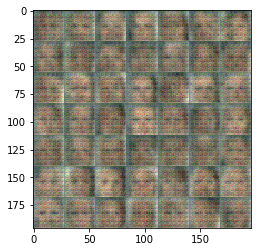

Epoch 1/1... Discriminator Loss: 0.2648... Generator Loss: 2.3843
Epoch 1/1... Discriminator Loss: 0.3273... Generator Loss: 2.3966
Epoch 1/1... Discriminator Loss: 0.1642... Generator Loss: 2.8525
Epoch 1/1... Discriminator Loss: 0.4845... Generator Loss: 1.9439
Epoch 1/1... Discriminator Loss: 0.2734... Generator Loss: 2.5571
Epoch 1/1... Discriminator Loss: 0.3513... Generator Loss: 2.0682
Epoch 1/1... Discriminator Loss: 0.2909... Generator Loss: 2.4412
Epoch 1/1... Discriminator Loss: 0.1509... Generator Loss: 2.8447
Epoch 1/1... Discriminator Loss: 0.3891... Generator Loss: 2.0098
Epoch 1/1... Discriminator Loss: 0.1847... Generator Loss: 2.9979


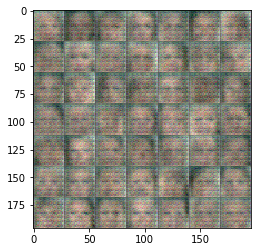

Epoch 1/1... Discriminator Loss: 0.2467... Generator Loss: 2.6531
Epoch 1/1... Discriminator Loss: 0.3265... Generator Loss: 2.3019
Epoch 1/1... Discriminator Loss: 0.1582... Generator Loss: 3.0077
Epoch 1/1... Discriminator Loss: 0.1644... Generator Loss: 2.4441
Epoch 1/1... Discriminator Loss: 0.2283... Generator Loss: 2.9436
Epoch 1/1... Discriminator Loss: 0.1661... Generator Loss: 2.7881
Epoch 1/1... Discriminator Loss: 0.2012... Generator Loss: 2.4836
Epoch 1/1... Discriminator Loss: 0.2376... Generator Loss: 2.5459
Epoch 1/1... Discriminator Loss: 0.2969... Generator Loss: 2.4786
Epoch 1/1... Discriminator Loss: 0.3348... Generator Loss: 1.9581


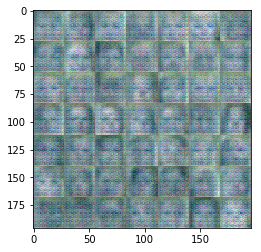

Epoch 1/1... Discriminator Loss: 0.2769... Generator Loss: 2.6143
Epoch 1/1... Discriminator Loss: 0.2900... Generator Loss: 2.0316
Epoch 1/1... Discriminator Loss: 0.2969... Generator Loss: 2.1269
Epoch 1/1... Discriminator Loss: 0.3924... Generator Loss: 2.0399
Epoch 1/1... Discriminator Loss: 0.2963... Generator Loss: 2.9012
Epoch 1/1... Discriminator Loss: 0.3235... Generator Loss: 2.7905
Epoch 1/1... Discriminator Loss: 0.4710... Generator Loss: 1.7730
Epoch 1/1... Discriminator Loss: 0.5306... Generator Loss: 1.5854
Epoch 1/1... Discriminator Loss: 0.6215... Generator Loss: 1.3405
Epoch 1/1... Discriminator Loss: 0.5665... Generator Loss: 1.8335


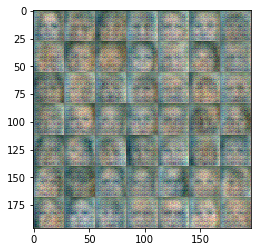

Epoch 1/1... Discriminator Loss: 0.8528... Generator Loss: 1.5215
Epoch 1/1... Discriminator Loss: 0.5625... Generator Loss: 1.8654
Epoch 1/1... Discriminator Loss: 0.6314... Generator Loss: 1.7878
Epoch 1/1... Discriminator Loss: 0.5109... Generator Loss: 1.5290
Epoch 1/1... Discriminator Loss: 0.3963... Generator Loss: 2.0673
Epoch 1/1... Discriminator Loss: 0.5185... Generator Loss: 1.6417
Epoch 1/1... Discriminator Loss: 0.4491... Generator Loss: 2.1252
Epoch 1/1... Discriminator Loss: 0.3974... Generator Loss: 1.9789
Epoch 1/1... Discriminator Loss: 0.3663... Generator Loss: 2.0077
Epoch 1/1... Discriminator Loss: 0.3756... Generator Loss: 2.0577


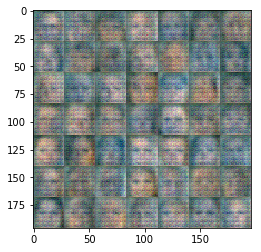

Epoch 1/1... Discriminator Loss: 0.5653... Generator Loss: 1.4471
Epoch 1/1... Discriminator Loss: 0.3964... Generator Loss: 2.0341
Epoch 1/1... Discriminator Loss: 0.3878... Generator Loss: 2.1252
Epoch 1/1... Discriminator Loss: 0.3133... Generator Loss: 2.2054
Epoch 1/1... Discriminator Loss: 0.3289... Generator Loss: 2.5077
Epoch 1/1... Discriminator Loss: 0.4289... Generator Loss: 2.2947
Epoch 1/1... Discriminator Loss: 0.2835... Generator Loss: 2.1638
Epoch 1/1... Discriminator Loss: 0.3886... Generator Loss: 2.1537
Epoch 1/1... Discriminator Loss: 0.2958... Generator Loss: 2.6451
Epoch 1/1... Discriminator Loss: 0.4633... Generator Loss: 2.0208


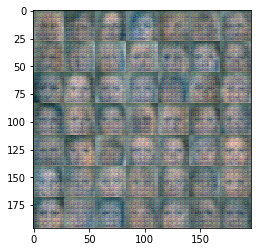

Epoch 1/1... Discriminator Loss: 0.6301... Generator Loss: 1.3493
Epoch 1/1... Discriminator Loss: 0.3983... Generator Loss: 1.8759
Epoch 1/1... Discriminator Loss: 0.3240... Generator Loss: 2.2484
Epoch 1/1... Discriminator Loss: 0.3536... Generator Loss: 2.1750
Epoch 1/1... Discriminator Loss: 0.4483... Generator Loss: 1.8192
Epoch 1/1... Discriminator Loss: 0.4820... Generator Loss: 1.8103
Epoch 1/1... Discriminator Loss: 0.3574... Generator Loss: 2.6812
Epoch 1/1... Discriminator Loss: 0.4566... Generator Loss: 2.0676
Epoch 1/1... Discriminator Loss: 0.5004... Generator Loss: 1.5380
Epoch 1/1... Discriminator Loss: 0.5392... Generator Loss: 1.7625


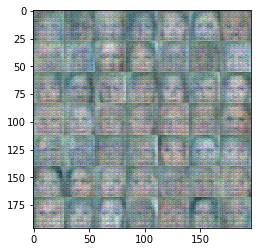

Epoch 1/1... Discriminator Loss: 0.4994... Generator Loss: 1.4875
Epoch 1/1... Discriminator Loss: 0.3341... Generator Loss: 2.0311
Epoch 1/1... Discriminator Loss: 0.3266... Generator Loss: 2.2958
Epoch 1/1... Discriminator Loss: 0.3953... Generator Loss: 2.1539
Epoch 1/1... Discriminator Loss: 0.3887... Generator Loss: 1.9720
Epoch 1/1... Discriminator Loss: 0.5421... Generator Loss: 1.8820
Epoch 1/1... Discriminator Loss: 0.2469... Generator Loss: 2.2616
Epoch 1/1... Discriminator Loss: 0.4948... Generator Loss: 1.7427
Epoch 1/1... Discriminator Loss: 0.4258... Generator Loss: 2.0092
Epoch 1/1... Discriminator Loss: 0.2746... Generator Loss: 2.1037


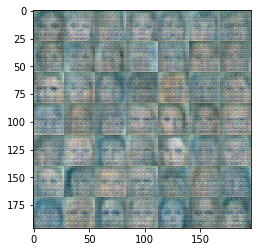

Epoch 1/1... Discriminator Loss: 0.5519... Generator Loss: 1.6805
Epoch 1/1... Discriminator Loss: 0.3286... Generator Loss: 2.1203
Epoch 1/1... Discriminator Loss: 0.2307... Generator Loss: 2.2431
Epoch 1/1... Discriminator Loss: 0.2307... Generator Loss: 2.2607
Epoch 1/1... Discriminator Loss: 0.5337... Generator Loss: 1.5521
Epoch 1/1... Discriminator Loss: 0.3887... Generator Loss: 1.9348
Epoch 1/1... Discriminator Loss: 0.3881... Generator Loss: 1.6536
Epoch 1/1... Discriminator Loss: 0.3131... Generator Loss: 1.8523
Epoch 1/1... Discriminator Loss: 0.3240... Generator Loss: 2.2767
Epoch 1/1... Discriminator Loss: 0.2586... Generator Loss: 2.9525


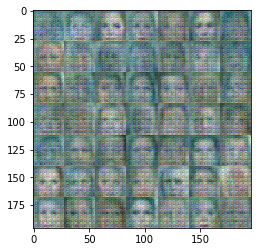

Epoch 1/1... Discriminator Loss: 0.2265... Generator Loss: 2.4516
Epoch 1/1... Discriminator Loss: 0.3311... Generator Loss: 1.9613
Epoch 1/1... Discriminator Loss: 0.4694... Generator Loss: 2.0239
Epoch 1/1... Discriminator Loss: 0.2939... Generator Loss: 2.2738
Epoch 1/1... Discriminator Loss: 0.2530... Generator Loss: 2.2852
Epoch 1/1... Discriminator Loss: 0.3315... Generator Loss: 1.8267
Epoch 1/1... Discriminator Loss: 0.3448... Generator Loss: 2.0148
Epoch 1/1... Discriminator Loss: 0.3803... Generator Loss: 1.9551
Epoch 1/1... Discriminator Loss: 0.2995... Generator Loss: 2.0259
Epoch 1/1... Discriminator Loss: 0.2711... Generator Loss: 2.1905


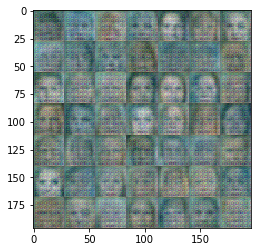

Epoch 1/1... Discriminator Loss: 0.3338... Generator Loss: 1.9406
Epoch 1/1... Discriminator Loss: 0.3561... Generator Loss: 2.3244
Epoch 1/1... Discriminator Loss: 0.4436... Generator Loss: 2.2783
Epoch 1/1... Discriminator Loss: 0.3787... Generator Loss: 2.1635
Epoch 1/1... Discriminator Loss: 0.3255... Generator Loss: 2.0711
Epoch 1/1... Discriminator Loss: 0.3675... Generator Loss: 2.2824
Epoch 1/1... Discriminator Loss: 0.3728... Generator Loss: 1.9393
Epoch 1/1... Discriminator Loss: 0.3478... Generator Loss: 2.0269
Epoch 1/1... Discriminator Loss: 0.2911... Generator Loss: 2.0740
Epoch 1/1... Discriminator Loss: 0.4287... Generator Loss: 1.8286


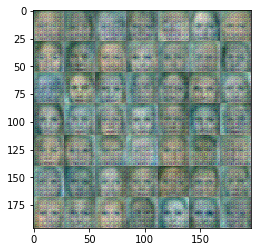

Epoch 1/1... Discriminator Loss: 0.5361... Generator Loss: 1.5530
Epoch 1/1... Discriminator Loss: 0.3578... Generator Loss: 1.9603
Epoch 1/1... Discriminator Loss: 0.2743... Generator Loss: 2.1289
Epoch 1/1... Discriminator Loss: 0.3736... Generator Loss: 1.6532
Epoch 1/1... Discriminator Loss: 0.3478... Generator Loss: 2.3924
Epoch 1/1... Discriminator Loss: 0.4882... Generator Loss: 1.8927
Epoch 1/1... Discriminator Loss: 0.3233... Generator Loss: 2.5914
Epoch 1/1... Discriminator Loss: 0.4778... Generator Loss: 1.8698
Epoch 1/1... Discriminator Loss: 0.2932... Generator Loss: 2.1757
Epoch 1/1... Discriminator Loss: 0.3533... Generator Loss: 2.0920


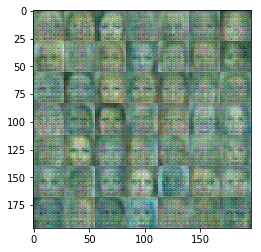

Epoch 1/1... Discriminator Loss: 0.2986... Generator Loss: 2.1846
Epoch 1/1... Discriminator Loss: 0.2401... Generator Loss: 2.5901
Epoch 1/1... Discriminator Loss: 0.2957... Generator Loss: 2.5046
Epoch 1/1... Discriminator Loss: 0.2835... Generator Loss: 1.8903
Epoch 1/1... Discriminator Loss: 0.1504... Generator Loss: 2.7987
Epoch 1/1... Discriminator Loss: 0.3059... Generator Loss: 2.2050
Epoch 1/1... Discriminator Loss: 0.1545... Generator Loss: 2.8805
Epoch 1/1... Discriminator Loss: 0.2830... Generator Loss: 2.2647
Epoch 1/1... Discriminator Loss: 0.2431... Generator Loss: 2.1581
Epoch 1/1... Discriminator Loss: 0.2380... Generator Loss: 2.0351


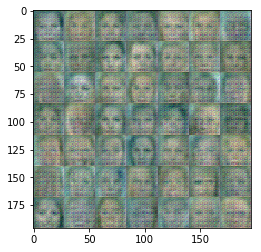

Epoch 1/1... Discriminator Loss: 0.2630... Generator Loss: 2.3111
Epoch 1/1... Discriminator Loss: 0.4386... Generator Loss: 1.7444
Epoch 1/1... Discriminator Loss: 0.2690... Generator Loss: 2.2131
Epoch 1/1... Discriminator Loss: 0.2683... Generator Loss: 2.6847
Epoch 1/1... Discriminator Loss: 0.2815... Generator Loss: 2.4515
Epoch 1/1... Discriminator Loss: 0.1534... Generator Loss: 2.6448
Epoch 1/1... Discriminator Loss: 0.3139... Generator Loss: 2.3720
Epoch 1/1... Discriminator Loss: 0.1696... Generator Loss: 2.5252
Epoch 1/1... Discriminator Loss: 0.2924... Generator Loss: 2.0751
Epoch 1/1... Discriminator Loss: 0.2376... Generator Loss: 2.9203


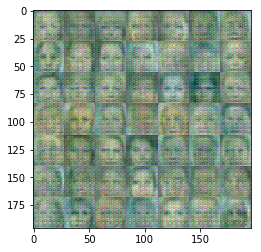

Epoch 1/1... Discriminator Loss: 0.2858... Generator Loss: 2.3505
Epoch 1/1... Discriminator Loss: 0.2739... Generator Loss: 2.1563
Epoch 1/1... Discriminator Loss: 0.1765... Generator Loss: 2.4988
Epoch 1/1... Discriminator Loss: 0.1438... Generator Loss: 3.3714
Epoch 1/1... Discriminator Loss: 0.1643... Generator Loss: 2.6642
Epoch 1/1... Discriminator Loss: 0.1728... Generator Loss: 2.6516
Epoch 1/1... Discriminator Loss: 0.2157... Generator Loss: 3.4229
Epoch 1/1... Discriminator Loss: 0.1314... Generator Loss: 2.8498
Epoch 1/1... Discriminator Loss: 0.1413... Generator Loss: 2.6479
Epoch 1/1... Discriminator Loss: 0.2426... Generator Loss: 2.7453


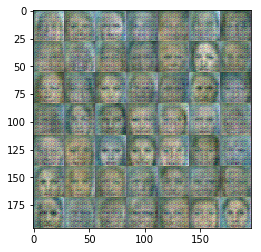

Epoch 1/1... Discriminator Loss: 0.3819... Generator Loss: 1.6912
Epoch 1/1... Discriminator Loss: 0.1665... Generator Loss: 2.3178
Epoch 1/1... Discriminator Loss: 0.3457... Generator Loss: 2.3590
Epoch 1/1... Discriminator Loss: 0.3915... Generator Loss: 2.0706
Epoch 1/1... Discriminator Loss: 0.1339... Generator Loss: 2.7481
Epoch 1/1... Discriminator Loss: 0.2453... Generator Loss: 2.2756
Epoch 1/1... Discriminator Loss: 0.2553... Generator Loss: 2.6460
Epoch 1/1... Discriminator Loss: 0.1287... Generator Loss: 3.7261
Epoch 1/1... Discriminator Loss: 0.1744... Generator Loss: 2.8912
Epoch 1/1... Discriminator Loss: 0.1227... Generator Loss: 3.1194


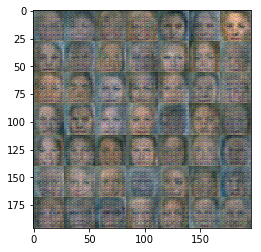

Epoch 1/1... Discriminator Loss: 0.2072... Generator Loss: 2.4321
Epoch 1/1... Discriminator Loss: 0.2433... Generator Loss: 2.3253
Epoch 1/1... Discriminator Loss: 0.3064... Generator Loss: 2.2650
Epoch 1/1... Discriminator Loss: 0.2091... Generator Loss: 2.7062
Epoch 1/1... Discriminator Loss: 0.1373... Generator Loss: 2.9222
Epoch 1/1... Discriminator Loss: 0.2345... Generator Loss: 2.7012
Epoch 1/1... Discriminator Loss: 0.4909... Generator Loss: 1.8149
Epoch 1/1... Discriminator Loss: 0.3979... Generator Loss: 1.7831
Epoch 1/1... Discriminator Loss: 0.3124... Generator Loss: 2.5993
Epoch 1/1... Discriminator Loss: 0.2407... Generator Loss: 2.2979


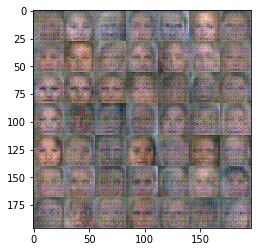

Epoch 1/1... Discriminator Loss: 0.2986... Generator Loss: 2.3952
Epoch 1/1... Discriminator Loss: 0.2767... Generator Loss: 2.6686
Epoch 1/1... Discriminator Loss: 0.2090... Generator Loss: 2.6546
Epoch 1/1... Discriminator Loss: 0.1491... Generator Loss: 3.3642
Epoch 1/1... Discriminator Loss: 0.3038... Generator Loss: 2.3338
Epoch 1/1... Discriminator Loss: 0.2099... Generator Loss: 2.5609
Epoch 1/1... Discriminator Loss: 0.1734... Generator Loss: 3.0409
Epoch 1/1... Discriminator Loss: 0.3651... Generator Loss: 1.9892
Epoch 1/1... Discriminator Loss: 0.2730... Generator Loss: 2.7872
Epoch 1/1... Discriminator Loss: 0.1503... Generator Loss: 2.5272


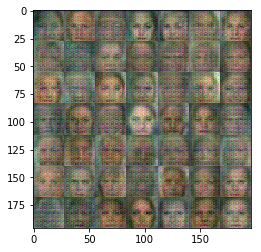

Epoch 1/1... Discriminator Loss: 0.1924... Generator Loss: 2.3130
Epoch 1/1... Discriminator Loss: 0.3184... Generator Loss: 2.0066
Epoch 1/1... Discriminator Loss: 0.2526... Generator Loss: 2.2996
Epoch 1/1... Discriminator Loss: 0.1942... Generator Loss: 2.8132
Epoch 1/1... Discriminator Loss: 0.3482... Generator Loss: 2.2229
Epoch 1/1... Discriminator Loss: 0.3547... Generator Loss: 2.1829
Epoch 1/1... Discriminator Loss: 0.3056... Generator Loss: 1.9266
Epoch 1/1... Discriminator Loss: 0.3378... Generator Loss: 2.3075
Epoch 1/1... Discriminator Loss: 0.3233... Generator Loss: 2.2510
Epoch 1/1... Discriminator Loss: 0.3493... Generator Loss: 2.5150


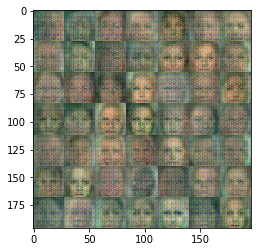

Epoch 1/1... Discriminator Loss: 0.3848... Generator Loss: 2.8973
Epoch 1/1... Discriminator Loss: 0.3611... Generator Loss: 2.2568
Epoch 1/1... Discriminator Loss: 0.3558... Generator Loss: 1.8387
Epoch 1/1... Discriminator Loss: 0.2284... Generator Loss: 2.1064
Epoch 1/1... Discriminator Loss: 0.3867... Generator Loss: 2.3838
Epoch 1/1... Discriminator Loss: 0.5998... Generator Loss: 1.8473
Epoch 1/1... Discriminator Loss: 0.3521... Generator Loss: 2.5778
Epoch 1/1... Discriminator Loss: 0.3670... Generator Loss: 2.3162
Epoch 1/1... Discriminator Loss: 0.4349... Generator Loss: 1.7893
Epoch 1/1... Discriminator Loss: 0.3538... Generator Loss: 2.1193


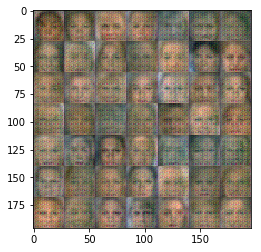

Epoch 1/1... Discriminator Loss: 0.5657... Generator Loss: 1.6150
Epoch 1/1... Discriminator Loss: 0.4480... Generator Loss: 2.1636
Epoch 1/1... Discriminator Loss: 0.5131... Generator Loss: 1.7348
Epoch 1/1... Discriminator Loss: 0.3429... Generator Loss: 2.2646
Epoch 1/1... Discriminator Loss: 0.3873... Generator Loss: 2.2335
Epoch 1/1... Discriminator Loss: 0.4786... Generator Loss: 1.7003
Epoch 1/1... Discriminator Loss: 0.3716... Generator Loss: 2.1539
Epoch 1/1... Discriminator Loss: 0.4201... Generator Loss: 2.1620
Epoch 1/1... Discriminator Loss: 0.7775... Generator Loss: 1.1752
Epoch 1/1... Discriminator Loss: 0.5387... Generator Loss: 1.5773


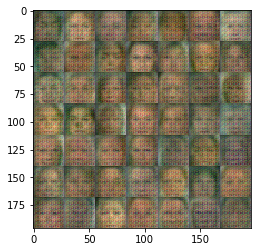

Epoch 1/1... Discriminator Loss: 0.6347... Generator Loss: 1.3995
Epoch 1/1... Discriminator Loss: 0.6885... Generator Loss: 1.2027
Epoch 1/1... Discriminator Loss: 0.4669... Generator Loss: 1.7634
Epoch 1/1... Discriminator Loss: 0.3547... Generator Loss: 2.4878
Epoch 1/1... Discriminator Loss: 0.5453... Generator Loss: 1.5881
Epoch 1/1... Discriminator Loss: 0.3659... Generator Loss: 1.9276
Epoch 1/1... Discriminator Loss: 0.5583... Generator Loss: 2.0013
Epoch 1/1... Discriminator Loss: 0.5748... Generator Loss: 2.3043
Epoch 1/1... Discriminator Loss: 0.6325... Generator Loss: 1.8435
Epoch 1/1... Discriminator Loss: 0.3570... Generator Loss: 2.2633


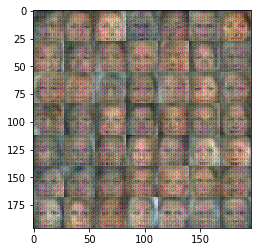

Epoch 1/1... Discriminator Loss: 0.4390... Generator Loss: 1.8170
Epoch 1/1... Discriminator Loss: 0.6223... Generator Loss: 1.7742
Epoch 1/1... Discriminator Loss: 0.5818... Generator Loss: 1.4893
Epoch 1/1... Discriminator Loss: 0.6983... Generator Loss: 1.4050
Epoch 1/1... Discriminator Loss: 0.4214... Generator Loss: 1.7752
Epoch 1/1... Discriminator Loss: 0.3973... Generator Loss: 1.7384
Epoch 1/1... Discriminator Loss: 0.7964... Generator Loss: 1.3470
Epoch 1/1... Discriminator Loss: 0.6488... Generator Loss: 1.2461
Epoch 1/1... Discriminator Loss: 0.5017... Generator Loss: 1.7319
Epoch 1/1... Discriminator Loss: 0.4673... Generator Loss: 1.9309


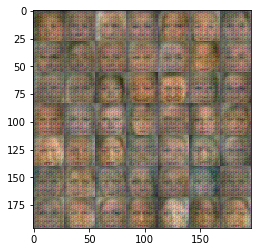

Epoch 1/1... Discriminator Loss: 0.4606... Generator Loss: 1.8922
Epoch 1/1... Discriminator Loss: 0.5860... Generator Loss: 1.4051
Epoch 1/1... Discriminator Loss: 0.5368... Generator Loss: 1.6392
Epoch 1/1... Discriminator Loss: 0.4130... Generator Loss: 1.9775
Epoch 1/1... Discriminator Loss: 0.6067... Generator Loss: 1.4972
Epoch 1/1... Discriminator Loss: 0.4773... Generator Loss: 1.8622
Epoch 1/1... Discriminator Loss: 0.5301... Generator Loss: 1.9770
Epoch 1/1... Discriminator Loss: 0.4446... Generator Loss: 1.5697
Epoch 1/1... Discriminator Loss: 0.4867... Generator Loss: 1.9904
Epoch 1/1... Discriminator Loss: 0.5908... Generator Loss: 1.5985


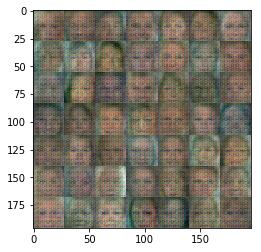

Epoch 1/1... Discriminator Loss: 0.8228... Generator Loss: 1.2404
Epoch 1/1... Discriminator Loss: 0.6426... Generator Loss: 2.0794
Epoch 1/1... Discriminator Loss: 0.4485... Generator Loss: 1.9027
Epoch 1/1... Discriminator Loss: 0.5785... Generator Loss: 1.5010
Epoch 1/1... Discriminator Loss: 0.4861... Generator Loss: 1.7553
Epoch 1/1... Discriminator Loss: 0.4196... Generator Loss: 2.4151
Epoch 1/1... Discriminator Loss: 0.4045... Generator Loss: 1.9875
Epoch 1/1... Discriminator Loss: 0.5757... Generator Loss: 1.4708
Epoch 1/1... Discriminator Loss: 0.6492... Generator Loss: 1.6854
Epoch 1/1... Discriminator Loss: 0.6729... Generator Loss: 2.0061


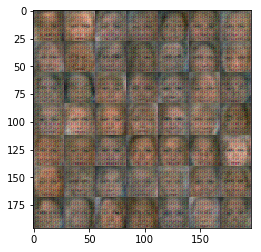

Epoch 1/1... Discriminator Loss: 0.8362... Generator Loss: 1.3373
Epoch 1/1... Discriminator Loss: 0.4277... Generator Loss: 2.1826
Epoch 1/1... Discriminator Loss: 0.4793... Generator Loss: 1.7139
Epoch 1/1... Discriminator Loss: 0.4152... Generator Loss: 1.7228
Epoch 1/1... Discriminator Loss: 0.4872... Generator Loss: 1.5135
Epoch 1/1... Discriminator Loss: 0.7027... Generator Loss: 1.3587
Epoch 1/1... Discriminator Loss: 0.6869... Generator Loss: 1.8626
Epoch 1/1... Discriminator Loss: 0.5461... Generator Loss: 1.9316
Epoch 1/1... Discriminator Loss: 0.6875... Generator Loss: 1.6330
Epoch 1/1... Discriminator Loss: 0.4013... Generator Loss: 1.8682


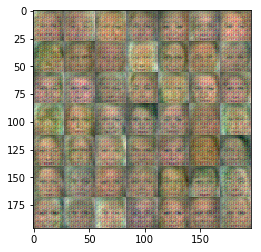

Epoch 1/1... Discriminator Loss: 0.5762... Generator Loss: 1.5055
Epoch 1/1... Discriminator Loss: 0.5580... Generator Loss: 1.6418
Epoch 1/1... Discriminator Loss: 0.4303... Generator Loss: 2.1546
Epoch 1/1... Discriminator Loss: 0.4833... Generator Loss: 1.7690
Epoch 1/1... Discriminator Loss: 0.5197... Generator Loss: 1.6160
Epoch 1/1... Discriminator Loss: 0.7933... Generator Loss: 1.4721
Epoch 1/1... Discriminator Loss: 0.8099... Generator Loss: 1.3433
Epoch 1/1... Discriminator Loss: 0.8530... Generator Loss: 1.3088
Epoch 1/1... Discriminator Loss: 0.6593... Generator Loss: 1.6054
Epoch 1/1... Discriminator Loss: 0.4699... Generator Loss: 2.0262


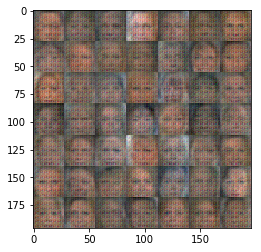

Epoch 1/1... Discriminator Loss: 0.5357... Generator Loss: 1.7423
Epoch 1/1... Discriminator Loss: 0.6906... Generator Loss: 1.2559
Epoch 1/1... Discriminator Loss: 0.4528... Generator Loss: 1.7196
Epoch 1/1... Discriminator Loss: 0.7699... Generator Loss: 1.2691
Epoch 1/1... Discriminator Loss: 0.6872... Generator Loss: 1.2968
Epoch 1/1... Discriminator Loss: 0.4960... Generator Loss: 1.8592
Epoch 1/1... Discriminator Loss: 0.4979... Generator Loss: 1.4522
Epoch 1/1... Discriminator Loss: 0.6131... Generator Loss: 1.4648
Epoch 1/1... Discriminator Loss: 0.5904... Generator Loss: 1.3986
Epoch 1/1... Discriminator Loss: 0.6604... Generator Loss: 1.7040


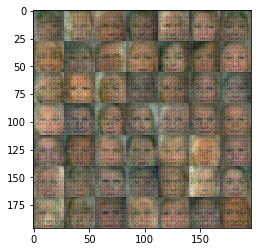

Epoch 1/1... Discriminator Loss: 0.7259... Generator Loss: 1.4871
Epoch 1/1... Discriminator Loss: 0.7011... Generator Loss: 1.2562
Epoch 1/1... Discriminator Loss: 0.4845... Generator Loss: 1.8088
Epoch 1/1... Discriminator Loss: 0.4929... Generator Loss: 1.5934
Epoch 1/1... Discriminator Loss: 0.6165... Generator Loss: 1.3907
Epoch 1/1... Discriminator Loss: 0.4362... Generator Loss: 2.0311
Epoch 1/1... Discriminator Loss: 0.4856... Generator Loss: 1.7413
Epoch 1/1... Discriminator Loss: 0.8026... Generator Loss: 1.1068
Epoch 1/1... Discriminator Loss: 0.6946... Generator Loss: 1.6574
Epoch 1/1... Discriminator Loss: 0.7696... Generator Loss: 1.4047


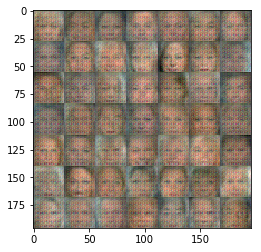

Epoch 1/1... Discriminator Loss: 0.7287... Generator Loss: 1.5061
Epoch 1/1... Discriminator Loss: 0.6012... Generator Loss: 1.7562
Epoch 1/1... Discriminator Loss: 0.5918... Generator Loss: 1.3761
Epoch 1/1... Discriminator Loss: 0.8027... Generator Loss: 1.2146
Epoch 1/1... Discriminator Loss: 0.6725... Generator Loss: 1.3965
Epoch 1/1... Discriminator Loss: 0.7636... Generator Loss: 1.1814
Epoch 1/1... Discriminator Loss: 0.6102... Generator Loss: 1.9742
Epoch 1/1... Discriminator Loss: 0.5876... Generator Loss: 1.8086
Epoch 1/1... Discriminator Loss: 0.7202... Generator Loss: 1.4517
Epoch 1/1... Discriminator Loss: 0.4702... Generator Loss: 2.0667


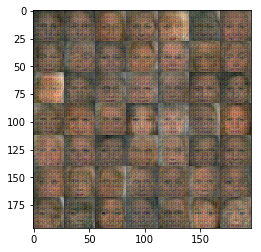

Epoch 1/1... Discriminator Loss: 0.7362... Generator Loss: 1.4657
Epoch 1/1... Discriminator Loss: 0.6055... Generator Loss: 1.7863
Epoch 1/1... Discriminator Loss: 0.5751... Generator Loss: 1.6624
Epoch 1/1... Discriminator Loss: 0.5225... Generator Loss: 1.7697
Epoch 1/1... Discriminator Loss: 0.5207... Generator Loss: 1.6676
Epoch 1/1... Discriminator Loss: 0.5806... Generator Loss: 1.7217
Epoch 1/1... Discriminator Loss: 0.6633... Generator Loss: 1.5890
Epoch 1/1... Discriminator Loss: 0.5262... Generator Loss: 1.7346
Epoch 1/1... Discriminator Loss: 0.5583... Generator Loss: 1.8516
Epoch 1/1... Discriminator Loss: 0.7506... Generator Loss: 1.2951


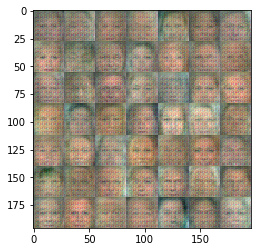

Epoch 1/1... Discriminator Loss: 0.4918... Generator Loss: 1.7267
Epoch 1/1... Discriminator Loss: 0.4329... Generator Loss: 1.8429
Epoch 1/1... Discriminator Loss: 0.7091... Generator Loss: 1.4403
Epoch 1/1... Discriminator Loss: 0.6384... Generator Loss: 1.3038
Epoch 1/1... Discriminator Loss: 0.5223... Generator Loss: 1.4566
Epoch 1/1... Discriminator Loss: 0.8384... Generator Loss: 1.4432
Epoch 1/1... Discriminator Loss: 0.5407... Generator Loss: 1.4049
Epoch 1/1... Discriminator Loss: 0.7091... Generator Loss: 1.6313
Epoch 1/1... Discriminator Loss: 0.7016... Generator Loss: 1.7028
Epoch 1/1... Discriminator Loss: 0.5653... Generator Loss: 1.9450


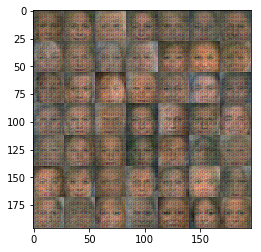

Epoch 1/1... Discriminator Loss: 0.7187... Generator Loss: 1.4572
Epoch 1/1... Discriminator Loss: 0.3983... Generator Loss: 1.8107
Epoch 1/1... Discriminator Loss: 0.4235... Generator Loss: 1.6864
Epoch 1/1... Discriminator Loss: 0.4892... Generator Loss: 1.7234
Epoch 1/1... Discriminator Loss: 0.5444... Generator Loss: 1.6349
Epoch 1/1... Discriminator Loss: 0.6692... Generator Loss: 1.4364
Epoch 1/1... Discriminator Loss: 0.7904... Generator Loss: 1.3164
Epoch 1/1... Discriminator Loss: 0.6465... Generator Loss: 1.2783
Epoch 1/1... Discriminator Loss: 0.6982... Generator Loss: 1.3573
Epoch 1/1... Discriminator Loss: 0.4272... Generator Loss: 1.9880


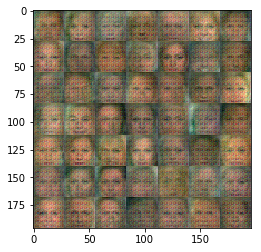

Epoch 1/1... Discriminator Loss: 0.6161... Generator Loss: 1.4419
Epoch 1/1... Discriminator Loss: 0.5790... Generator Loss: 1.9783
Epoch 1/1... Discriminator Loss: 0.8291... Generator Loss: 1.4289
Epoch 1/1... Discriminator Loss: 0.5235... Generator Loss: 1.6705
Epoch 1/1... Discriminator Loss: 0.5387... Generator Loss: 1.9576
Epoch 1/1... Discriminator Loss: 0.5635... Generator Loss: 1.5672
Epoch 1/1... Discriminator Loss: 0.8259... Generator Loss: 1.2898
Epoch 1/1... Discriminator Loss: 0.6861... Generator Loss: 1.5371
Epoch 1/1... Discriminator Loss: 0.5277... Generator Loss: 1.7774
Epoch 1/1... Discriminator Loss: 0.9561... Generator Loss: 1.0971


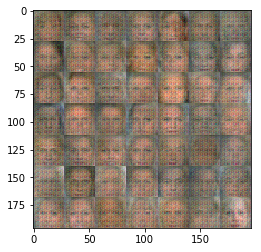

Epoch 1/1... Discriminator Loss: 0.7004... Generator Loss: 1.2442
Epoch 1/1... Discriminator Loss: 0.5992... Generator Loss: 1.7967
Epoch 1/1... Discriminator Loss: 0.4684... Generator Loss: 1.6731
Epoch 1/1... Discriminator Loss: 0.7315... Generator Loss: 1.2591
Epoch 1/1... Discriminator Loss: 0.5132... Generator Loss: 1.5311
Epoch 1/1... Discriminator Loss: 0.6552... Generator Loss: 1.8555
Epoch 1/1... Discriminator Loss: 0.6428... Generator Loss: 1.3709
Epoch 1/1... Discriminator Loss: 0.6440... Generator Loss: 1.4211
Epoch 1/1... Discriminator Loss: 0.7102... Generator Loss: 1.7154
Epoch 1/1... Discriminator Loss: 0.5297... Generator Loss: 1.7649


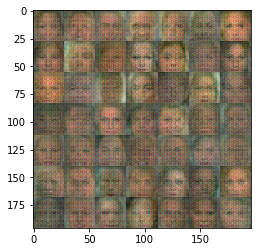

Epoch 1/1... Discriminator Loss: 0.6465... Generator Loss: 1.5456
Epoch 1/1... Discriminator Loss: 0.6314... Generator Loss: 1.4092
Epoch 1/1... Discriminator Loss: 0.4865... Generator Loss: 1.7670
Epoch 1/1... Discriminator Loss: 0.6188... Generator Loss: 1.5869
Epoch 1/1... Discriminator Loss: 0.8068... Generator Loss: 1.2785
Epoch 1/1... Discriminator Loss: 0.6027... Generator Loss: 1.4355
Epoch 1/1... Discriminator Loss: 0.8640... Generator Loss: 1.1219
Epoch 1/1... Discriminator Loss: 0.4886... Generator Loss: 1.7773
Epoch 1/1... Discriminator Loss: 0.6884... Generator Loss: 1.3717
Epoch 1/1... Discriminator Loss: 0.7157... Generator Loss: 1.1895


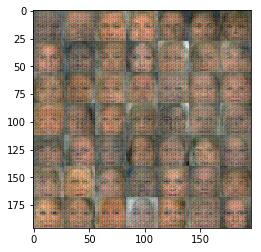

Epoch 1/1... Discriminator Loss: 0.5708... Generator Loss: 1.6226
Epoch 1/1... Discriminator Loss: 0.6450... Generator Loss: 1.4696
Epoch 1/1... Discriminator Loss: 0.6434... Generator Loss: 1.2724
Epoch 1/1... Discriminator Loss: 0.7069... Generator Loss: 1.5024
Epoch 1/1... Discriminator Loss: 0.7402... Generator Loss: 1.3086
Epoch 1/1... Discriminator Loss: 0.6505... Generator Loss: 2.0069
Epoch 1/1... Discriminator Loss: 0.5744... Generator Loss: 1.7845
Epoch 1/1... Discriminator Loss: 0.5107... Generator Loss: 1.7480
Epoch 1/1... Discriminator Loss: 0.4942... Generator Loss: 1.9466
Epoch 1/1... Discriminator Loss: 0.4694... Generator Loss: 2.1331


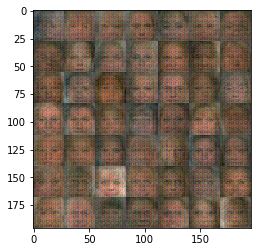

Epoch 1/1... Discriminator Loss: 0.8099... Generator Loss: 1.2348
Epoch 1/1... Discriminator Loss: 0.6540... Generator Loss: 1.5629
Epoch 1/1... Discriminator Loss: 0.7111... Generator Loss: 1.2489
Epoch 1/1... Discriminator Loss: 0.9775... Generator Loss: 1.1078
Epoch 1/1... Discriminator Loss: 0.5451... Generator Loss: 1.4245
Epoch 1/1... Discriminator Loss: 0.5888... Generator Loss: 1.9932
Epoch 1/1... Discriminator Loss: 0.7271... Generator Loss: 1.3717
Epoch 1/1... Discriminator Loss: 0.6666... Generator Loss: 1.5677
Epoch 1/1... Discriminator Loss: 0.5539... Generator Loss: 1.6691
Epoch 1/1... Discriminator Loss: 0.6645... Generator Loss: 1.5762


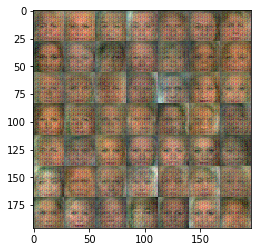

Epoch 1/1... Discriminator Loss: 0.4889... Generator Loss: 1.7117
Epoch 1/1... Discriminator Loss: 0.7022... Generator Loss: 1.3799
Epoch 1/1... Discriminator Loss: 0.5859... Generator Loss: 1.6116
Epoch 1/1... Discriminator Loss: 0.5892... Generator Loss: 1.7865
Epoch 1/1... Discriminator Loss: 0.7747... Generator Loss: 1.4780
Epoch 1/1... Discriminator Loss: 0.5364... Generator Loss: 1.6156
Epoch 1/1... Discriminator Loss: 0.6233... Generator Loss: 1.3862
Epoch 1/1... Discriminator Loss: 0.6670... Generator Loss: 1.0492
Epoch 1/1... Discriminator Loss: 0.7232... Generator Loss: 1.3103
Epoch 1/1... Discriminator Loss: 0.5048... Generator Loss: 2.1154


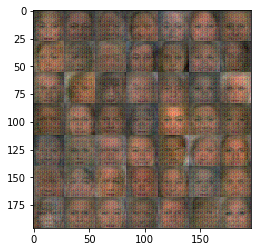

Epoch 1/1... Discriminator Loss: 0.5592... Generator Loss: 1.3985
Epoch 1/1... Discriminator Loss: 0.6139... Generator Loss: 1.4004
Epoch 1/1... Discriminator Loss: 0.9459... Generator Loss: 1.1527
Epoch 1/1... Discriminator Loss: 0.6075... Generator Loss: 1.7735
Epoch 1/1... Discriminator Loss: 0.7796... Generator Loss: 1.2387
Epoch 1/1... Discriminator Loss: 0.9413... Generator Loss: 1.1309
Epoch 1/1... Discriminator Loss: 0.7605... Generator Loss: 1.5831
Epoch 1/1... Discriminator Loss: 0.5550... Generator Loss: 1.7350
Epoch 1/1... Discriminator Loss: 0.7360... Generator Loss: 1.1896
Epoch 1/1... Discriminator Loss: 0.5072... Generator Loss: 1.8726


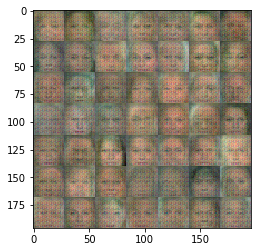

Epoch 1/1... Discriminator Loss: 0.6427... Generator Loss: 1.4227
Epoch 1/1... Discriminator Loss: 0.5824... Generator Loss: 1.8225
Epoch 1/1... Discriminator Loss: 0.6788... Generator Loss: 1.5331
Epoch 1/1... Discriminator Loss: 0.6657... Generator Loss: 1.7204
Epoch 1/1... Discriminator Loss: 0.5024... Generator Loss: 1.7772
Epoch 1/1... Discriminator Loss: 0.5195... Generator Loss: 1.7821
Epoch 1/1... Discriminator Loss: 0.6025... Generator Loss: 1.6974
Epoch 1/1... Discriminator Loss: 0.7438... Generator Loss: 1.4025
Epoch 1/1... Discriminator Loss: 0.6725... Generator Loss: 1.4806
Epoch 1/1... Discriminator Loss: 0.5697... Generator Loss: 1.3825


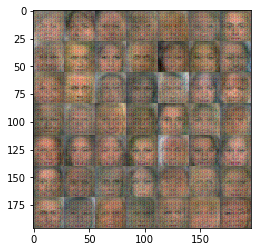

Epoch 1/1... Discriminator Loss: 0.5451... Generator Loss: 1.6973
Epoch 1/1... Discriminator Loss: 0.5693... Generator Loss: 1.3976
Epoch 1/1... Discriminator Loss: 0.4653... Generator Loss: 1.7307
Epoch 1/1... Discriminator Loss: 0.7360... Generator Loss: 1.6013
Epoch 1/1... Discriminator Loss: 0.6639... Generator Loss: 1.5001
Epoch 1/1... Discriminator Loss: 0.6940... Generator Loss: 1.3912
Epoch 1/1... Discriminator Loss: 0.8651... Generator Loss: 1.2696
Epoch 1/1... Discriminator Loss: 0.7686... Generator Loss: 1.2717
Epoch 1/1... Discriminator Loss: 0.6607... Generator Loss: 1.3699
Epoch 1/1... Discriminator Loss: 0.5572... Generator Loss: 1.6582


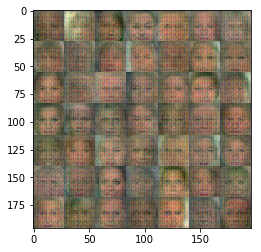

Epoch 1/1... Discriminator Loss: 0.6927... Generator Loss: 1.3621
Epoch 1/1... Discriminator Loss: 0.5839... Generator Loss: 1.5673
Epoch 1/1... Discriminator Loss: 0.7088... Generator Loss: 1.2908
Epoch 1/1... Discriminator Loss: 0.6505... Generator Loss: 1.3287
Epoch 1/1... Discriminator Loss: 0.5230... Generator Loss: 1.6612
Epoch 1/1... Discriminator Loss: 0.5681... Generator Loss: 1.4342
Epoch 1/1... Discriminator Loss: 0.5142... Generator Loss: 1.5536
Epoch 1/1... Discriminator Loss: 0.7513... Generator Loss: 1.3946
Epoch 1/1... Discriminator Loss: 0.7466... Generator Loss: 1.5939
Epoch 1/1... Discriminator Loss: 0.4030... Generator Loss: 1.8165


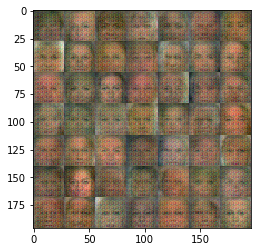

Epoch 1/1... Discriminator Loss: 0.5004... Generator Loss: 1.5082
Epoch 1/1... Discriminator Loss: 0.8155... Generator Loss: 1.3077
Epoch 1/1... Discriminator Loss: 0.6371... Generator Loss: 1.4921
Epoch 1/1... Discriminator Loss: 0.6929... Generator Loss: 1.4510
Epoch 1/1... Discriminator Loss: 0.8543... Generator Loss: 1.1525
Epoch 1/1... Discriminator Loss: 0.7604... Generator Loss: 1.1743
Epoch 1/1... Discriminator Loss: 0.7053... Generator Loss: 1.7435
Epoch 1/1... Discriminator Loss: 0.6014... Generator Loss: 1.4918
Epoch 1/1... Discriminator Loss: 0.6666... Generator Loss: 1.4201
Epoch 1/1... Discriminator Loss: 0.5231... Generator Loss: 1.4860


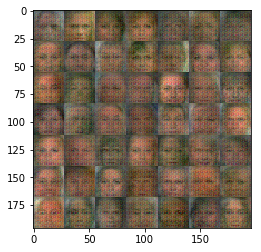

Epoch 1/1... Discriminator Loss: 0.6136... Generator Loss: 1.3754
Epoch 1/1... Discriminator Loss: 0.7152... Generator Loss: 1.5752
Epoch 1/1... Discriminator Loss: 0.6815... Generator Loss: 1.4435
Epoch 1/1... Discriminator Loss: 0.4340... Generator Loss: 1.8749
Epoch 1/1... Discriminator Loss: 0.6237... Generator Loss: 1.8508
Epoch 1/1... Discriminator Loss: 0.5789... Generator Loss: 1.5082
Epoch 1/1... Discriminator Loss: 0.8553... Generator Loss: 1.1372
Epoch 1/1... Discriminator Loss: 0.4885... Generator Loss: 1.8196
Epoch 1/1... Discriminator Loss: 0.7255... Generator Loss: 1.4344
Epoch 1/1... Discriminator Loss: 0.6916... Generator Loss: 1.5068


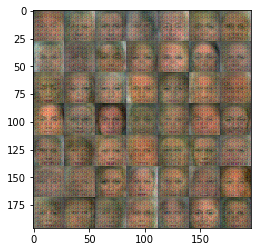

Epoch 1/1... Discriminator Loss: 0.6652... Generator Loss: 1.6018
Epoch 1/1... Discriminator Loss: 0.4686... Generator Loss: 1.6620
Epoch 1/1... Discriminator Loss: 0.6678... Generator Loss: 1.2723
Epoch 1/1... Discriminator Loss: 0.6633... Generator Loss: 1.3071
Epoch 1/1... Discriminator Loss: 0.7574... Generator Loss: 1.4873
Epoch 1/1... Discriminator Loss: 0.7106... Generator Loss: 1.2221
Epoch 1/1... Discriminator Loss: 0.6085... Generator Loss: 1.5356
Epoch 1/1... Discriminator Loss: 0.4446... Generator Loss: 1.7570
Epoch 1/1... Discriminator Loss: 0.4604... Generator Loss: 1.9297
Epoch 1/1... Discriminator Loss: 0.4911... Generator Loss: 1.4750


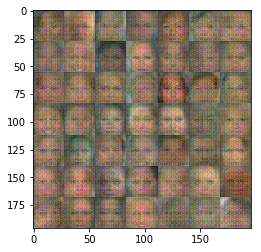

Epoch 1/1... Discriminator Loss: 0.7760... Generator Loss: 1.1717
Epoch 1/1... Discriminator Loss: 0.8552... Generator Loss: 1.3843
Epoch 1/1... Discriminator Loss: 0.6135... Generator Loss: 1.7328
Epoch 1/1... Discriminator Loss: 0.7082... Generator Loss: 1.2523
Epoch 1/1... Discriminator Loss: 0.6327... Generator Loss: 1.5011
Epoch 1/1... Discriminator Loss: 0.3865... Generator Loss: 1.8028
Epoch 1/1... Discriminator Loss: 0.7122... Generator Loss: 1.2192
Epoch 1/1... Discriminator Loss: 0.8484... Generator Loss: 1.1972
Epoch 1/1... Discriminator Loss: 0.7271... Generator Loss: 1.2568
Epoch 1/1... Discriminator Loss: 0.6486... Generator Loss: 1.5955


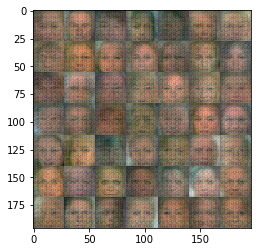

Epoch 1/1... Discriminator Loss: 0.7010... Generator Loss: 1.4606
Epoch 1/1... Discriminator Loss: 0.8264... Generator Loss: 1.0767
Epoch 1/1... Discriminator Loss: 0.6849... Generator Loss: 1.3386
Epoch 1/1... Discriminator Loss: 0.7916... Generator Loss: 1.5839
Epoch 1/1... Discriminator Loss: 0.5568... Generator Loss: 1.5025
Epoch 1/1... Discriminator Loss: 0.5553... Generator Loss: 1.7758
Epoch 1/1... Discriminator Loss: 0.6661... Generator Loss: 1.7136
Epoch 1/1... Discriminator Loss: 0.6968... Generator Loss: 1.3068
Epoch 1/1... Discriminator Loss: 0.6892... Generator Loss: 1.3911
Epoch 1/1... Discriminator Loss: 0.8133... Generator Loss: 1.2686


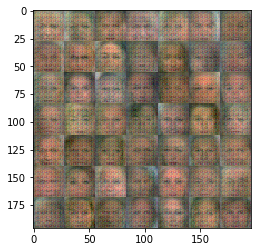

Epoch 1/1... Discriminator Loss: 0.7994... Generator Loss: 1.3259
Epoch 1/1... Discriminator Loss: 0.5643... Generator Loss: 1.4956
Epoch 1/1... Discriminator Loss: 1.0194... Generator Loss: 0.8709
Epoch 1/1... Discriminator Loss: 0.3372... Generator Loss: 1.7891
Epoch 1/1... Discriminator Loss: 0.6029... Generator Loss: 1.5952
Epoch 1/1... Discriminator Loss: 0.6306... Generator Loss: 1.2429
Epoch 1/1... Discriminator Loss: 0.4949... Generator Loss: 1.6648
Epoch 1/1... Discriminator Loss: 0.6080... Generator Loss: 1.3572
Epoch 1/1... Discriminator Loss: 0.5801... Generator Loss: 1.3283
Epoch 1/1... Discriminator Loss: 0.6975... Generator Loss: 1.4477


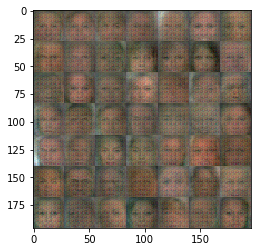

Epoch 1/1... Discriminator Loss: 0.5982... Generator Loss: 1.3173
Epoch 1/1... Discriminator Loss: 0.7528... Generator Loss: 1.1961
Epoch 1/1... Discriminator Loss: 0.6423... Generator Loss: 1.2714
Epoch 1/1... Discriminator Loss: 0.6584... Generator Loss: 1.4536
Epoch 1/1... Discriminator Loss: 0.6444... Generator Loss: 1.5029
Epoch 1/1... Discriminator Loss: 0.8840... Generator Loss: 1.0145
Epoch 1/1... Discriminator Loss: 0.6420... Generator Loss: 1.3233
Epoch 1/1... Discriminator Loss: 0.5548... Generator Loss: 1.6328
Epoch 1/1... Discriminator Loss: 0.7438... Generator Loss: 1.2738
Epoch 1/1... Discriminator Loss: 0.7166... Generator Loss: 1.6602


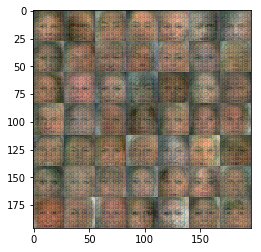

Epoch 1/1... Discriminator Loss: 0.4229... Generator Loss: 1.9338
Epoch 1/1... Discriminator Loss: 0.7923... Generator Loss: 1.1984
Epoch 1/1... Discriminator Loss: 0.6687... Generator Loss: 1.3323
Epoch 1/1... Discriminator Loss: 0.9186... Generator Loss: 1.2825
Epoch 1/1... Discriminator Loss: 0.5107... Generator Loss: 1.5836
Epoch 1/1... Discriminator Loss: 0.5522... Generator Loss: 1.7375
Epoch 1/1... Discriminator Loss: 0.7220... Generator Loss: 1.3941
Epoch 1/1... Discriminator Loss: 0.6616... Generator Loss: 1.4093
Epoch 1/1... Discriminator Loss: 0.8945... Generator Loss: 1.3131
Epoch 1/1... Discriminator Loss: 0.6266... Generator Loss: 1.2708


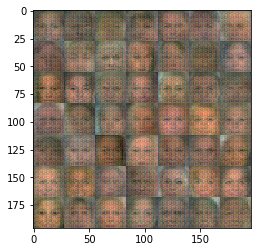

Epoch 1/1... Discriminator Loss: 0.6418... Generator Loss: 1.6074
Epoch 1/1... Discriminator Loss: 0.5938... Generator Loss: 1.5760
Epoch 1/1... Discriminator Loss: 0.5862... Generator Loss: 2.0046
Epoch 1/1... Discriminator Loss: 0.5297... Generator Loss: 1.5384
Epoch 1/1... Discriminator Loss: 0.6683... Generator Loss: 1.4720
Epoch 1/1... Discriminator Loss: 0.5546... Generator Loss: 1.5036
Epoch 1/1... Discriminator Loss: 0.7780... Generator Loss: 1.1476
Epoch 1/1... Discriminator Loss: 0.6087... Generator Loss: 1.3445
Epoch 1/1... Discriminator Loss: 0.5030... Generator Loss: 1.7515
Epoch 1/1... Discriminator Loss: 0.6392... Generator Loss: 1.4884


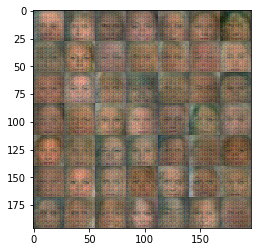

Epoch 1/1... Discriminator Loss: 0.3103... Generator Loss: 2.1334
Epoch 1/1... Discriminator Loss: 0.4787... Generator Loss: 1.6962
Epoch 1/1... Discriminator Loss: 0.6541... Generator Loss: 1.2409
Epoch 1/1... Discriminator Loss: 0.9631... Generator Loss: 1.1506
Epoch 1/1... Discriminator Loss: 0.7870... Generator Loss: 1.6004
Epoch 1/1... Discriminator Loss: 0.7565... Generator Loss: 1.1516
Epoch 1/1... Discriminator Loss: 0.5257... Generator Loss: 1.8384
Epoch 1/1... Discriminator Loss: 0.6788... Generator Loss: 1.5073
Epoch 1/1... Discriminator Loss: 0.7889... Generator Loss: 1.1389
Epoch 1/1... Discriminator Loss: 0.5123... Generator Loss: 1.5167


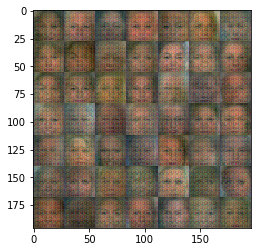

Epoch 1/1... Discriminator Loss: 0.5442... Generator Loss: 1.6981
Epoch 1/1... Discriminator Loss: 0.8521... Generator Loss: 1.2687
Epoch 1/1... Discriminator Loss: 0.5294... Generator Loss: 1.6032
Epoch 1/1... Discriminator Loss: 0.7126... Generator Loss: 1.4650
Epoch 1/1... Discriminator Loss: 0.6449... Generator Loss: 1.6691
Epoch 1/1... Discriminator Loss: 0.6490... Generator Loss: 1.4883


KeyboardInterrupt: 

In [15]:
batch_size = 32
z_dim = 100
learning_rate = 1e-5
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.